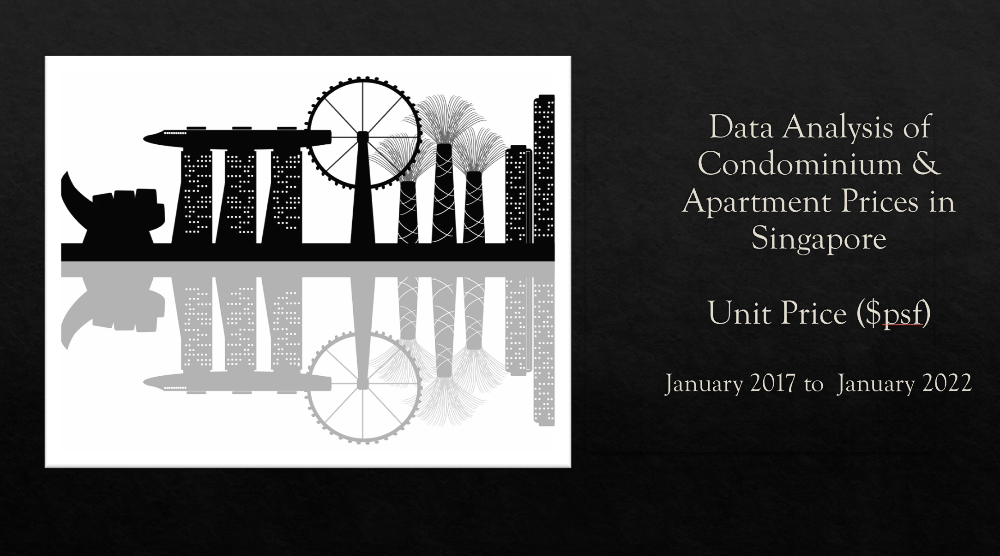

In [1]:
import numpy as np
import pandas as pd
from pandas import Series, DataFrame

import chart_studio
import chart_studio.plotly as py
import chart_studio.tools as tls


import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter, FormatStrFormatter

import seaborn as sns
sns.set()

import plotly
import plotly.graph_objs as go#graph objects
import plotly.offline as offline
offline.init_notebook_mode(connected=True)

%matplotlib inline
plt.style.use("Solarize_Light2")

In [2]:
# Read the data of all the districts for  Condominiums and Apartments in Singapore(2017 to 2022)
df_singapore_condo_apt_data = pd.read_csv('singapore_districts_combined_dataset_condo_apt.csv') # 

# delete S/N column
del df_singapore_condo_apt_data['S/N']

# Sort the price of property in ascending order according to Unit Price($psf).
df_singapore_condo_apt_data.sort_values(["Unit Price ($psf)"],axis=0,ascending=[False],inplace=True) 

# Describe the dataset
df_singapore_condo_apt_data.describe()


,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf)
count,105934.000000,105934.000000,1.059340e+05,105934.000000,105934.000000
mean,13.865747,1.061718,1.792358e+06,1151.924245,1562.789916
std,6.810216,3.640613,9.667202e+06,6129.392036,540.717538
min,1.000000,1.000000,3.400000e+05,258.000000,280.000000
25%,9.000000,1.000000,1.000000e+06,678.000000,1197.000000
50%,15.000000,1.000000,1.323000e+06,947.000000,1491.000000
75%,19.000000,1.000000,1.776000e+06,1259.000000,1799.000000
max,28.000000,560.000000,9.800000e+08,947081.000000,6210.000000


In [3]:
# Returns the first 5 rows of dataset
df_singapore_condo_apt_data.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,Oct-21
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,Mar-21
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,May-21
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,May-21
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,Dec-21


In [4]:
# datasets has 105934 rows and 15 columns
df_singapore_condo_apt_data.shape 

(105934, 15)

In [5]:
# Print a summary of the dataframe
df_singapore_condo_apt_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105934 entries, 22566 to 61963
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Project Name       105934 non-null  object
 1   Street Name        105934 non-null  object
 2   Type               105934 non-null  object
 3   Postal District    105934 non-null  int64 
 4   Market Segment     105934 non-null  object
 5   Tenure             105932 non-null  object
 6   Type of Sale       105934 non-null  object
 7   No. of Units       105934 non-null  int64 
 8   Price ($)          105934 non-null  int64 
 9   Nett Price ($)     105934 non-null  object
 10  Area (Sqft)        105934 non-null  int64 
 11  Type of Area       105934 non-null  object
 12  Floor Level        105934 non-null  object
 13  Unit Price ($psf)  105934 non-null  int64 
 14  Date of Sale       105934 non-null  object
dtypes: int64(5), object(10)
memory usage: 12.9+ MB


In [6]:
# Observe the corelations within the dataframe
df_singapore_condo_apt_data.corr() 

,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf)
Postal District,1.000000,-0.003214,-0.035954,-0.005095,-0.473432
No. of Units,-0.003214,1.000000,0.910905,0.985778,0.005612
Price ($),-0.035954,0.910905,1.000000,0.930535,0.081127
Area (Sqft),-0.005095,0.985778,0.930535,1.000000,-0.002421
Unit Price ($psf),-0.473432,0.005612,0.081127,-0.002421,1.000000


Text(0.5, 1.0, 'Singapore Condominiums and Apartments correlation matrix')

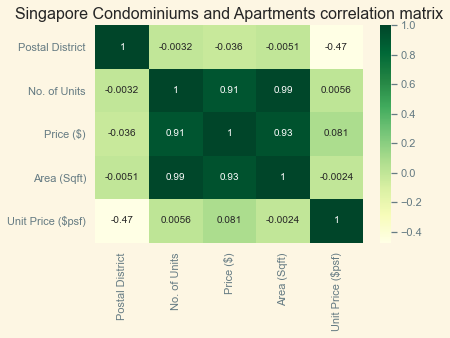

In [7]:
# Create the corerelation matrix using seaborn
sns.heatmap(df_singapore_condo_apt_data.corr(),cmap='YlGn',annot=True)

plt.title('Singapore Condominiums and Apartments correlation matrix')

##  *Data Cleaning - Missing Entries*

In [8]:
# Check for missing entries
df_singapore_condo_apt_data.isna().sum()

Project Name         0
Street Name          0
Type                 0
Postal District      0
Market Segment       0
Tenure               2
Type of Sale         0
No. of Units         0
Price ($)            0
Nett Price ($)       0
Area (Sqft)          0
Type of Area         0
Floor Level          0
Unit Price ($psf)    0
Date of Sale         0
dtype: int64

### Since 'Tenure' is in string format, a check is done to see which type of tenure has the most of number of units.

In [9]:
 df_tenure = df_singapore_condo_apt_data.groupby(['Tenure'])['No. of Units'].sum().reset_index()
df_tenure.head(5)

,Tenure,No. of Units
0,100 yrs lease commencing from 1986,294
1,101 yrs lease commencing from 1985,565
2,102 yrs lease commencing from 1977,7
3,102 yrs lease commencing from 1978,36
4,102 yrs lease commencing from 1986,330


In [10]:
# Dataframe for 'Tenure' will be sorted to find the most common item in 'Tenure'.
df_tenure_sort = df_tenure.sort_values(["No. of Units"],axis=0,ascending=[False]) # Finding Most Common Item in Tenure 
df_tenure_sort.head(10)

,Tenure,No. of Units
121,Freehold,32923
70,99 yrs lease commencing from 2018,15263
71,99 yrs lease commencing from 2019,6263
69,99 yrs lease commencing from 2017,5485
68,99 yrs lease commencing from 2016,4708
63,99 yrs lease commencing from 2011,4607
64,99 yrs lease commencing from 2012,3438
67,99 yrs lease commencing from 2015,3301
66,99 yrs lease commencing from 2014,3044
62,99 yrs lease commencing from 2010,2685


In [11]:
# Replacement for missing entries
df_singapore_condo_apt_data['Tenure'].fillna(value="Freehold", inplace= True) 
df_singapore_condo_apt_data

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,Oct-21
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,Mar-21
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,May-21
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,May-21
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,Dec-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91278,MAYFAIR PARK,JALAN BINGKA,Apartment,21,RCR,99 yrs lease commencing from 1952,Resale,1,400000,-,915,Strata,01 to 05,437,Jun-21
60017,RESIDENTIAL APARTMENTS,BALESTIER ROAD,Apartment,12,RCR,9999 yrs lease commencing from 1961,Resale,1,820000,-,1900,Strata,01 to 05,432,Mar-17
46345,RESIDENTIAL APARTMENTS,JOO CHIAT TERRACE,Apartment,15,RCR,Freehold,Resale,1,505000,-,1195,Strata,01 to 05,423,Jan-20
35044,RESIDENTIAL APARTMENTS,SING JOO WALK,Apartment,8,RCR,Freehold,Resale,1,525000,-,1499,Strata,01 to 05,350,Jul-17


In [12]:
# Check for replacement in missing entries
check_for_replacement = df_singapore_condo_apt_data.isna().sum()
print(check_for_replacement) 

Project Name         0
Street Name          0
Type                 0
Postal District      0
Market Segment       0
Tenure               0
Type of Sale         0
No. of Units         0
Price ($)            0
Nett Price ($)       0
Area (Sqft)          0
Type of Area         0
Floor Level          0
Unit Price ($psf)    0
Date of Sale         0
dtype: int64


## *Converting date and time* within dataframe.

In [13]:
# Check the data type of each column.
print (df_singapore_condo_apt_data)
print (df_singapore_condo_apt_data.dtypes)

                 Project Name        Street Name         Type  \
22566      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
25439                    EDEN      DRAYCOTT PARK    Apartment   
24587      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
24549               PARK NOVA     TOMLINSON ROAD    Apartment   
21278      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
...                       ...                ...          ...   
91278            MAYFAIR PARK       JALAN BINGKA    Apartment   
60017  RESIDENTIAL APARTMENTS     BALESTIER ROAD    Apartment   
46345  RESIDENTIAL APARTMENTS  JOO CHIAT TERRACE    Apartment   
35044  RESIDENTIAL APARTMENTS      SING JOO WALK    Apartment   
61963  BEDOK SHOPPING COMPLEX         BEDOK ROAD    Apartment   

       Postal District Market Segment                               Tenure  \
22566               10            CCR                             Freehold   
25439               10            CCR                          

In [14]:
# Converting to Month and Year for Date of Sale.
df_singapore_condo_apt_data['Date of Sale'] = pd.to_datetime(df_singapore_condo_apt_data['Date of Sale'], format='%b-%y')

print (df_singapore_condo_apt_data)
print (df_singapore_condo_apt_data.dtypes)

                 Project Name        Street Name         Type  \
22566      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
25439                    EDEN      DRAYCOTT PARK    Apartment   
24587      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
24549               PARK NOVA     TOMLINSON ROAD    Apartment   
21278      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
...                       ...                ...          ...   
91278            MAYFAIR PARK       JALAN BINGKA    Apartment   
60017  RESIDENTIAL APARTMENTS     BALESTIER ROAD    Apartment   
46345  RESIDENTIAL APARTMENTS  JOO CHIAT TERRACE    Apartment   
35044  RESIDENTIAL APARTMENTS      SING JOO WALK    Apartment   
61963  BEDOK SHOPPING COMPLEX         BEDOK ROAD    Apartment   

       Postal District Market Segment                               Tenure  \
22566               10            CCR                             Freehold   
25439               10            CCR                          

In [15]:
#format to month and year for the Date of Sale
df_singapore_condo_apt_data['Date of Sale'] = pd.to_datetime(df_singapore_condo_apt_data['Date of Sale'], format='%Y%m')

print (df_singapore_condo_apt_data)
print (df_singapore_condo_apt_data.dtypes)


                 Project Name        Street Name         Type  \
22566      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
25439                    EDEN      DRAYCOTT PARK    Apartment   
24587      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
24549               PARK NOVA     TOMLINSON ROAD    Apartment   
21278      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
...                       ...                ...          ...   
91278            MAYFAIR PARK       JALAN BINGKA    Apartment   
60017  RESIDENTIAL APARTMENTS     BALESTIER ROAD    Apartment   
46345  RESIDENTIAL APARTMENTS  JOO CHIAT TERRACE    Apartment   
35044  RESIDENTIAL APARTMENTS      SING JOO WALK    Apartment   
61963  BEDOK SHOPPING COMPLEX         BEDOK ROAD    Apartment   

       Postal District Market Segment                               Tenure  \
22566               10            CCR                             Freehold   
25439               10            CCR                          

In [16]:
#Check the dataframe for change format in Date of Sale
df_singapore_condo_apt_data.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,2021-10-01
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,2021-03-01
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,2021-05-01
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,2021-05-01
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01


In [17]:
# Perform inserting Year into dataframe
df_singapore_condo_apt_data['Year'] = df_singapore_condo_apt_data['Date of Sale'].dt.year
df_singapore_condo_apt_data.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,2021-10-01,2021
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,2021-03-01,2021
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,2021-05-01,2021
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,2021-05-01,2021
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01,2021


In [18]:
# Performing inserting Month into dataframe
df_singapore_condo_apt_data['Month'] = df_singapore_condo_apt_data['Date of Sale'].dt.month
#df_mth = df_singapore_condo_apt_data.head()
#df_mth
df_singapore_condo_apt_data

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,2021-10-01,2021,10
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,2021-03-01,2021,3
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,2021-05-01,2021,5
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,2021-05-01,2021,5
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01,2021,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91278,MAYFAIR PARK,JALAN BINGKA,Apartment,21,RCR,99 yrs lease commencing from 1952,Resale,1,400000,-,915,Strata,01 to 05,437,2021-06-01,2021,6
60017,RESIDENTIAL APARTMENTS,BALESTIER ROAD,Apartment,12,RCR,9999 yrs lease commencing from 1961,Resale,1,820000,-,1900,Strata,01 to 05,432,2017-03-01,2017,3
46345,RESIDENTIAL APARTMENTS,JOO CHIAT TERRACE,Apartment,15,RCR,Freehold,Resale,1,505000,-,1195,Strata,01 to 05,423,2020-01-01,2020,1
35044,RESIDENTIAL APARTMENTS,SING JOO WALK,Apartment,8,RCR,Freehold,Resale,1,525000,-,1499,Strata,01 to 05,350,2017-07-01,2017,7


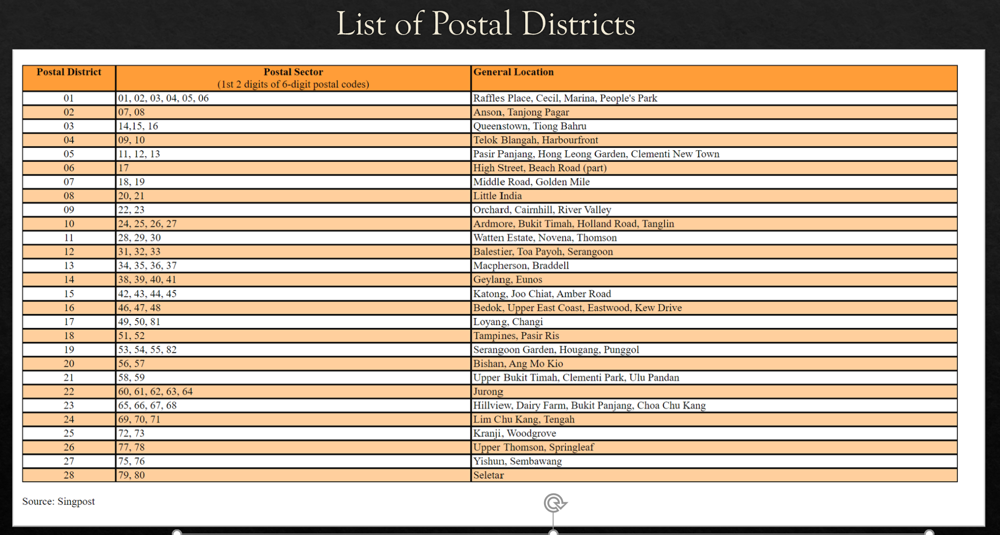

**Source** : https://www.ura.gov.sg/realEstateIIWeb/resources/misc/list_of_postal_districts.htm


## Private Residential Property Price Index Observation

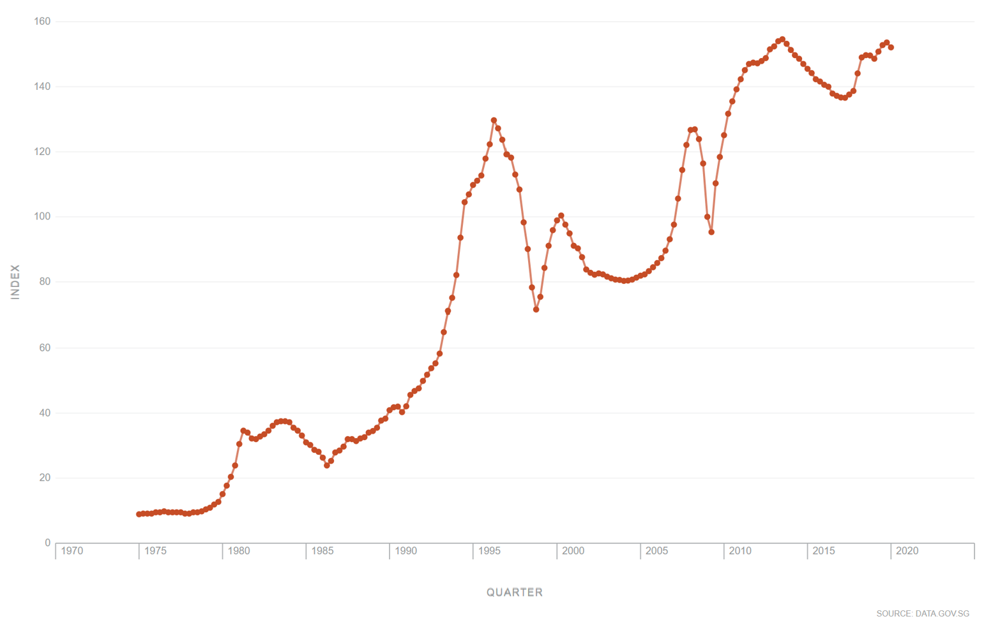

**Source** - https://data.gov.sg/dataset/private-residential-property-price-index-by-type-of-property

## Trends and Analysis (2017 – 2022)

Using **Parallel Coordinates Plot** to study the trend and analyze the dataset over more than 5 years (2017 to 2022), it gives an overview of the dataset. In the example below, we can observed the volume in the number of transactions within the year, postal district and number of units. We can also observed the trend in terms of Unit Price as well as Price from the plot.



In [ ]:
#import plotly.express as px
#import pandas as pd
#df_singapore_condo_apt_data

#fig = px.parallel_coordinates(
    #df_singapore_condo_apt_data,
    #dimensions=[
        #'Unit Price ($psf)', 'Price ($)','No. of Units', 'Postal District','Year', 
    #],
    #color='Year',
    #color_continuous_scale=px.colors.sequential.Emrld)
#fig.show()

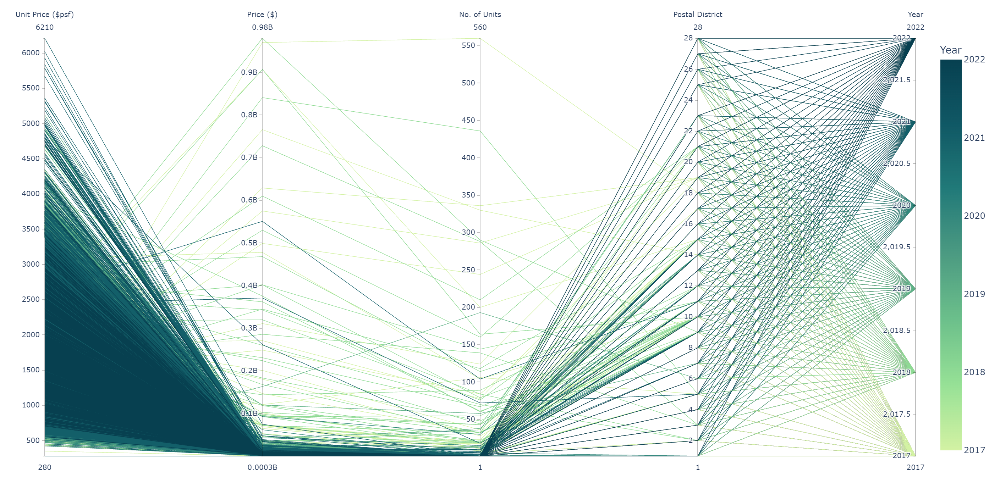

## Analyze and study the trend for transactions in terms of number of units within the districts. (2017 to 2022)

### Study the trend for transactions in terms of number of units within the districts for last 5 years.

In [21]:
# Study the trend for transactions in terms of number of units within the districts for Year.
df_year = df_singapore_condo_apt_data['Year'].value_counts()
print(df_year)
print("The total number of units sold :", df_singapore_condo_apt_data['Year'].value_counts().sum())


2021    29352
2017    20883
2018    19375
2020    18257
2019    16644
2022     1423
Name: Year, dtype: int64
The total number of units sold : 105934


In [22]:
# Remove the Year 2022 since it has smaller number as compared to other years
df_year_remove = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] !=2022 )].Year.value_counts().sort_index()
df_year_remove

2017    20883
2018    19375
2019    16644
2020    18257
2021    29352
Name: Year, dtype: int64

In [23]:
# Creating index for plot
df_year_remove.index = ['2017', '2018', '2019', '2020','2021']
df_year_remove

2017    20883
2018    19375
2019    16644
2020    18257
2021    29352
Name: Year, dtype: int64

Text(0.5, 0, 'Year')

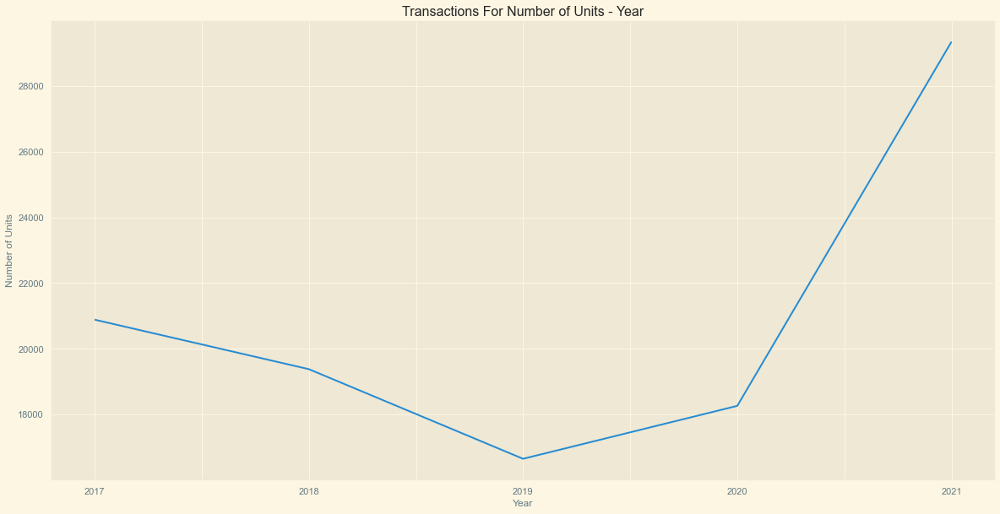

In [24]:
# Plot the graph to study the trnd in the number of units sold within the years.
df_year_remove.plot(x='Year', figsize=(20,10), title = "Transactions For Number of Units - Year")
plt.ylabel('Number of Units')
plt.xlabel('Year')

In [25]:
# Setting index to 'Project Name'
df_singapore_condo_apt_data.set_index('Project Name')

,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
Project Name,,,,,,,,,,,,,,,,
LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,2021-10-01,2021,10
EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,2021-03-01,2021,3
LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,2021-05-01,2021,5
PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,2021-05-01,2021,5
LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01,2021,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MAYFAIR PARK,JALAN BINGKA,Apartment,21,RCR,99 yrs lease commencing from 1952,Resale,1,400000,-,915,Strata,01 to 05,437,2021-06-01,2021,6
RESIDENTIAL APARTMENTS,BALESTIER ROAD,Apartment,12,RCR,9999 yrs lease commencing from 1961,Resale,1,820000,-,1900,Strata,01 to 05,432,2017-03-01,2017,3
RESIDENTIAL APARTMENTS,JOO CHIAT TERRACE,Apartment,15,RCR,Freehold,Resale,1,505000,-,1195,Strata,01 to 05,423,2020-01-01,2020,1


In [26]:
# Calculating % for the most number units sold in terms of year. The % will be included in plot 

max_year = df_singapore_condo_apt_data['Year'].value_counts()
df_2017 =df_year_remove.iloc[0]
df_2018 =df_year_remove.iloc[1]
df_2019 =df_year_remove.iloc[2]
df_2020 =df_year_remove.iloc[3]
df_2021 =df_year_remove.iloc[4]


tot_year_count = df_singapore_condo_apt_data['Project Name'].count()
percent_17 = round((df_2017/tot_year_count)*100,2)
percent_18 = round((df_2018/tot_year_count)*100,2)
percent_19 = round((df_2019/tot_year_count)*100,2)
percent_20 = round((df_2020/tot_year_count)*100,2)
percent_21 = round((df_2021/tot_year_count)*100,2)

print("Percentage of total number of units - 2017 is", percent_17,"%")
print("Percentage of total number of units - 2018 is", percent_18,"%")
print("Percentage of total number of units - 2019 is", percent_19,"%")
print("Percentage of total number of units - 2020 is", percent_20,"%")
print("Percentage of total number of units - 2021 is", percent_21,"%")

Percentage of total number of units - 2017 is 19.71 %
Percentage of total number of units - 2018 is 18.29 %
Percentage of total number of units - 2019 is 15.71 %
Percentage of total number of units - 2020 is 17.23 %
Percentage of total number of units - 2021 is 27.71 %


Text(4, 29352, '27.71%')

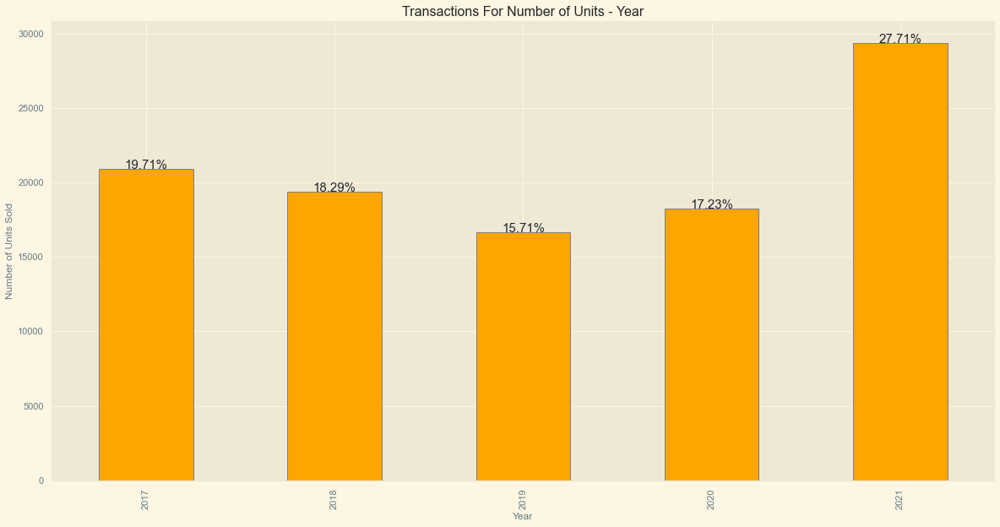

In [27]:
# Plotting Bar graph for Transactions For Number of Units - Year
plt.style.use("Solarize_Light2")
df_year_remove_plt = df_year_remove.plot(kind='bar',color = "orange", ec="grey", figsize=(20,10), title= "Transactions For Number of Units - Year")
plt.xlabel('Year')
plt.ylabel('Number of Units Sold')
plt.text(0,df_year_remove[0],'19.71%',ha='center',fontsize=15)
plt.text(1,df_year_remove[1],'18.29%',ha='center',fontsize=15)
plt.text(2,df_year_remove[2],'15.71%',ha='center',fontsize=15)
plt.text(3,df_year_remove[3],'17.23%',ha='center',fontsize=15)
plt.text(4,df_year_remove[4],'27.71%',ha='center',fontsize=15)

### Observation on data and plot

From the graphs shown, it tells us the trend of  number of transactions for number of units for the last 5 years. The year **2021** has the greatest number of units of **29352** which makes up **27.71%** of the total number of units. 



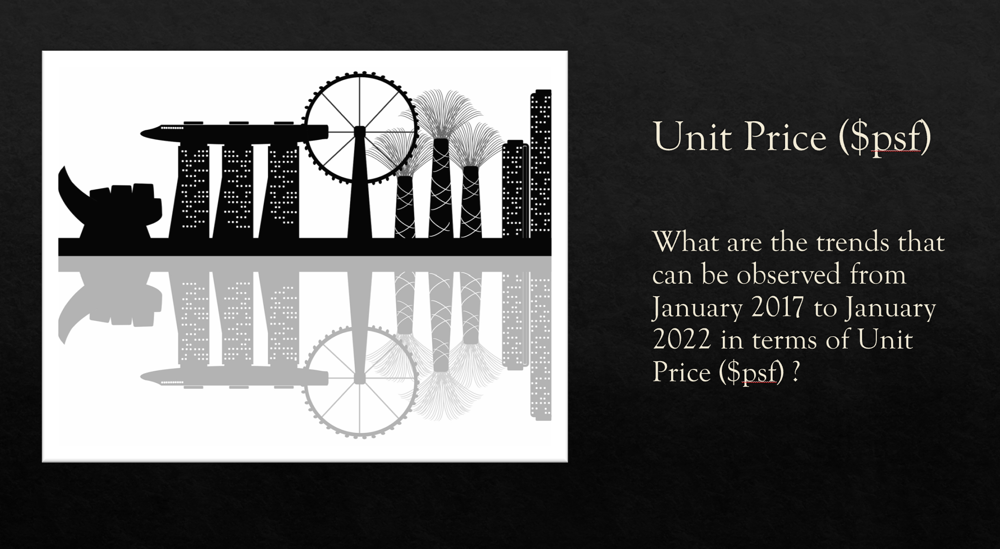

## Pairplot Analysis

- 'The Type' in terms of either Apartment or Condominium has been chosen in Pairplot Analysis.
- One such observation is for the Unit($psf), we can observe there are more apartments than condominiums for number of transactions within the districts


In [ ]:
# Using pairplot to analyze Unit price($psf) 
#sns.pairplot(df_singapore_condo_apt_data, hue='Type', palette='coolwarm')

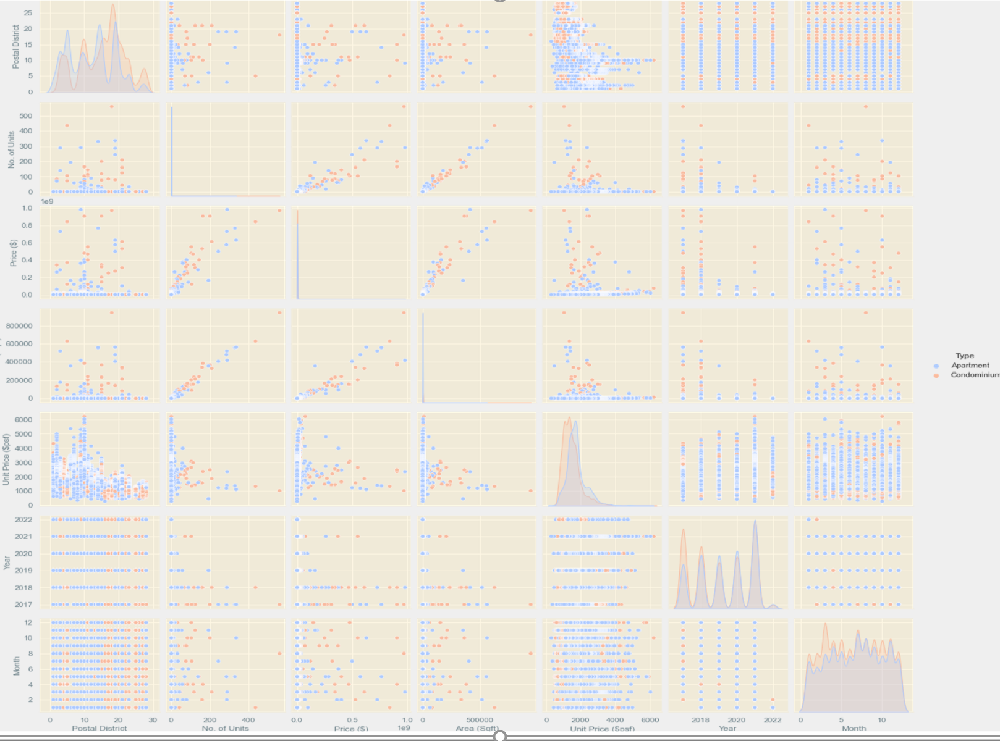

## What are the trends that can be observed from January 2017 to January 2022 in terms of Unit Price($psf)?

In [29]:
#Groupby the Unit Price and Number of Units
df_unit_v_no = df_singapore_condo_apt_data.groupby(['Unit Price ($psf)'])['No. of Units'].sum().reset_index()
df_unit_v_no.head(5)

,Unit Price ($psf),No. of Units
0,280,1
1,350,1
2,423,1
3,432,1
4,437,1


In [30]:
# Sorting according to number of units for Unit Price($psf)
df_sort = df_unit_v_no.sort_values(["No. of Units"],axis=0,ascending=[False]).reset_index()
df_sort.head(5)

,index,Unit Price ($psf),No. of Units
0,513,1024,618
1,825,1336,510
2,860,1371,438
3,605,1116,394
4,888,1399,388


In [31]:
# Finding the maximum value for both Unit price and number of units
df_unit_v_no.max()

Unit Price ($psf)    6210
No. of Units          618
dtype: int64

In [32]:
# df_unit_v_no dataset has 3325 rows and 2 columns
df_unit_v_no.shape

(3325, 2)

<AxesSubplot:xlabel='Unit Price ($psf)', ylabel='Count'>

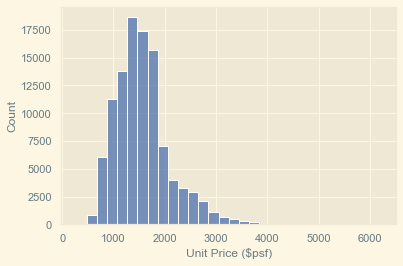

In [33]:
# Creating for analysis for mean and median
sns.histplot(df_singapore_condo_apt_data['Unit Price ($psf)'],kde=False, bins=30)

## Histogram Analysis and observation

- The graph indicates a Right Skewed histogram.
- The mean is more than median. 
- For our analysis in the dataset, using median might be more suitable for our analysis.


### Unit Price($psf) Analysis - (mean and median) 

In [34]:
# Unit Price Analysis - Jan 2017 to Jan 2022 (mean and median)
total_mean_u  = df_singapore_condo_apt_data['Unit Price ($psf)'].mean(axis=0)
total_median_u  = df_singapore_condo_apt_data['Unit Price ($psf)'].median(axis=0)

print("The mean Unit Price ($psf) of property in all districts is:$", round(total_mean_u,2)) # mean
print("The median Unit Price ($psf) of property in all districts is:$", round(total_median_u,2)) # median

The mean Unit Price ($psf) of property in all districts is:$ 1562.79
The median Unit Price ($psf) of property in all districts is:$ 1491.0


In [35]:
# Comparing the median Unit Price ($psf) from 2017 to 2021
y17 = 2017
y18 = 2018
y19 = 2019
y20 = 2020
y21 = 2021

year2017 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2017 )]
year2018 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2018 )]
year2019 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2019 )]
year2020 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2020 )]
year2021 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2021 )]


median_17 = year2017['Unit Price ($psf)'].median()
median_18 = year2018['Unit Price ($psf)'].median()
median_19 = year2019['Unit Price ($psf)'].median()
median_20 = year2020['Unit Price ($psf)'].median()
median_21 = year2021['Unit Price ($psf)'].median()

print("The median price in all districts is $", round(total_median_u,2)) # median
print("The median price for the year", y17, "is $", round(median_17,2) )
print("The median price for the year", y18, "is $", round(median_18,2) )
print("The median price for the year", y19, "is $", round(median_19,2) )
print("The median price for the year", y20, "is $", round(median_20,2) )
print("The median price for the year", y21, "is $", round(median_21,2) )


The median price in all districts is $ 1491.0
The median price for the year 2017 is $ 1346.0
The median price for the year 2018 is $ 1418.0
The median price for the year 2019 is $ 1515.0
The median price for the year 2020 is $ 1552.0
The median price for the year 2021 is $ 1610.0


In [36]:
# Comparing the mean Unit Price ($psf) from 2017 to 2021
y17 = 2017
y18 = 2018
y19 = 2019
y20 = 2020
y21 = 2021

total_median_price  = df_singapore_condo_apt_data['Price ($)'].median(axis=0)
year2017 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2017 )]
year2018 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2018 )]
year2019 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2019 )]
year2020 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2020 )]
year2021 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2021 )]

mean_17 = year2017['Unit Price ($psf)'].mean()
mean_18 = year2018['Unit Price ($psf)'].mean()
mean_19 = year2019['Unit Price ($psf)'].mean()
mean_20 = year2020['Unit Price ($psf)'].mean()
mean_21 = year2021['Unit Price ($psf)'].mean()

print("The median Unit Price ($psf) of property in all districts is:$", round(total_mean_u,2)) # median
print("The median Unit Price ($psf) for the year", y17, "is $", round(mean_17,2) )
print("The median Unit Price ($psf) for the year", y18, "is $", round(mean_18,2) )
print("The median Unit Price ($psf) for the year", y19, "is $", round(mean_19,2) )
print("The median Unit Price ($psf) for the year", y20, "is $", round(mean_20,2) )
print("The median Unit Price ($psf) for the year", y21, "is $", round(mean_21,2) )



The median Unit Price ($psf) of property in all districts is:$ 1562.79
The median Unit Price ($psf) for the year 2017 is $ 1404.46
The median Unit Price ($psf) for the year 2018 is $ 1486.61
The median Unit Price ($psf) for the year 2019 is $ 1606.84
The median Unit Price ($psf) for the year 2020 is $ 1577.3
The median Unit Price ($psf) for the year 2021 is $ 1681.45


In [37]:
#Creating table for mean median price comparison
import pandas as pd
from tabulate import tabulate

# creating a DataFrame
dict_district = {'Year' : ['2017 ', '2018', '2019', '2020', "2021"],
        'Mean Price ($)' : [mean_17, mean_18, mean_19,mean_20,mean_21 ],
        'Median Price ($)' : [median_17, median_18, median_19,median_20,median_21 ]
        
       }
dataframe3 = pd.DataFrame(dict_district)

  
# displaying the DataFrame
dataframe3
dataframe3.style.background_gradient()

#dataframe1.style.highlight_max(color = 'lightgreen', axis = 0)
#print(tabulate(dataframe1, headers = 'keys', tablefmt = 'pretty'))

,Year,Mean Price ($),Median Price ($)
0,2017,1404.460374,1346.000000
1,2018,1486.608258,1418.000000
2,2019,1606.844268,1515.000000
3,2020,1577.298461,1552.000000
4,2021,1681.446409,1610.000000


Text(0, 0.5, 'Price ($)')

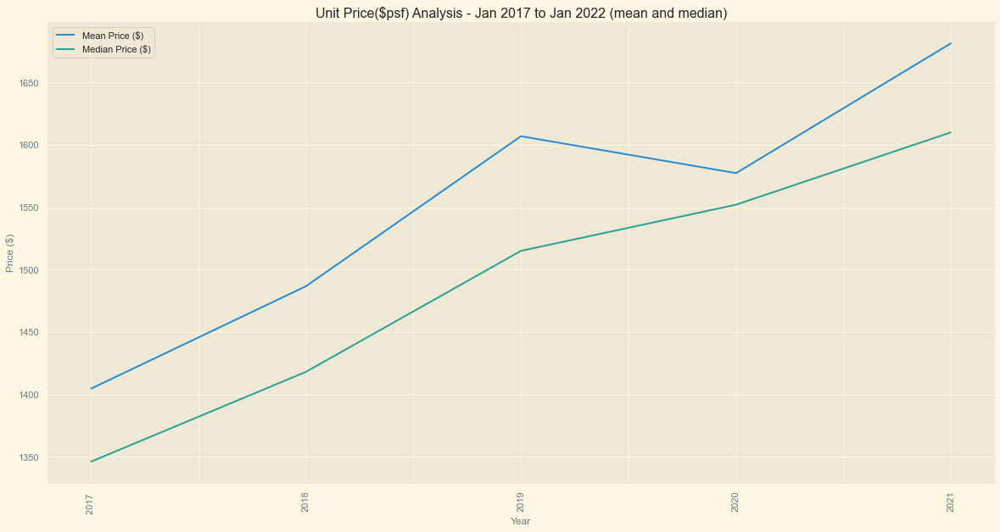

In [38]:
#Plotting mean and median for Unit Price ($psf)
dataframe3.plot(x = "Year",figsize=(20,10),  rot = 90, title = 'Unit Price($psf) Analysis - Jan 2017 to Jan 2022 (mean and median)')
plt.ylabel('Price ($)')

## Price Analysis and observation - Unit Price ($psf)

- The graph shows that price for both mean and median are on upward trend.
- The mean price went down in price 2020
- 2021 has the highest mean and median prices for the analysis. 


### Price($) Analysis - (mean and median) 

In [39]:
# Price Analysis - Jan 2017 to Jan 2022 (mean and median)
total_mean  = df_singapore_condo_apt_data['Price ($)'].mean(axis=0)
total_median  = df_singapore_condo_apt_data['Price ($)'].median(axis=0)

print("The mean price of property in all districts is:$", round(total_mean,2)) # mean
print("The median price of property in all districts is:$", round(total_median,2)) # mean


The mean price of property in all districts is:$ 1792357.56
The median price of property in all districts is:$ 1323000.0


In [40]:
# Comparing the mean Price ($) from 2017 to 2021
y17 = 2017
y18 = 2018
y19 = 2019
y20 = 2020
y21 = 2021

total_mean_price  = df_singapore_condo_apt_data['Price ($)'].mean(axis=0)
year2017 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2017 )]
year2018 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2018 )]
year2019 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2019 )]
year2020 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2020 )]
year2021 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2021 )]

mean_17 = year2017['Price ($)'].mean()
mean_18 = year2018['Price ($)'].mean()
mean_19 = year2019['Price ($)'].mean()
mean_20 = year2020['Price ($)'].mean()
mean_21 = year2021['Price ($)'].mean()


print("The mean price in all districts is $", round(total_mean_price,2)) # mean
print("The mean price for the year", y17, "is $", round(mean_17,2) )
print("The mean price for the year", y18, "is $", round(mean_18,2) )
print("The mean price for the year", y19, "is $", round(mean_19,2) )
print("The mean price for the year", y20, "is $", round(mean_20,2) )
print("The mean price for the year", y21, "is $", round(mean_21,2) )


The mean price in all districts is $ 1792357.56
The mean price for the year 2017 is $ 1844783.56
The mean price for the year 2018 is $ 2072991.1
The mean price for the year 2019 is $ 1639715.58
The mean price for the year 2020 is $ 1571098.77
The mean price for the year 2021 is $ 1787066.52


In [41]:
# Comparing the median Price ($) from 2017 to 2021
y17 = 2017
y18 = 2018
y19 = 2019
y20 = 2020
y21 = 2021

total_median_price  = df_singapore_condo_apt_data['Price ($)'].median(axis=0)
year2017 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2017 )]
year2018 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2018 )]
year2019 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2019 )]
year2020 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2020 )]
year2021 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2021 )]

median_17 = year2017['Price ($)'].median()
median_18 = year2018['Price ($)'].median()
median_19 = year2019['Price ($)'].median()
median_20 = year2020['Price ($)'].median()
median_21 = year2021['Price ($)'].median()


print("The median price in all districts is $", round(total_median_price,2)) # mean
print("The median price for the year", y17, "is $", round(median_17,2) )
print("The median price for the year", y18, "is $", round(median_18,2) )
print("The median price for the year", y19, "is $", round(median_19,2) )
print("The median price for the year", y20, "is $", round(median_20,2) )
print("The median price for the year", y21, "is $", round(median_21,2) )


The median price in all districts is $ 1323000.0
The median price for the year 2017 is $ 1260000.0
The median price for the year 2018 is $ 1255000.0
The median price for the year 2019 is $ 1298000.0
The median price for the year 2020 is $ 1328000.0
The median price for the year 2021 is $ 1450000.0


In [42]:
import pandas as pd
from tabulate import tabulate

# creating a DataFrame
dict_district = {'Year' : ['2017 ', '2018', '2019', '2020', "2021"],
        'Mean Price ($)' : [mean_17, mean_18, mean_19,mean_20,mean_21 ],
        'Median Price ($)' : [median_17, median_18, median_19,median_20,median_21 ]
        
       }
dataframe3 = pd.DataFrame(dict_district)

  
# displaying the DataFrame
dataframe3
dataframe3.style.background_gradient()

#dataframe1.style.highlight_max(color = 'lightgreen', axis = 0)
#print(tabulate(dataframe1, headers = 'keys', tablefmt = 'pretty'))

,Year,Mean Price ($),Median Price ($)
0,2017,1844783.555907,1260000.000000
1,2018,2072991.104619,1255000.000000
2,2019,1639715.584054,1298000.000000
3,2020,1571098.765843,1328000.000000
4,2021,1787066.515876,1450000.000000


Text(0, 0.5, 'Price ($)')

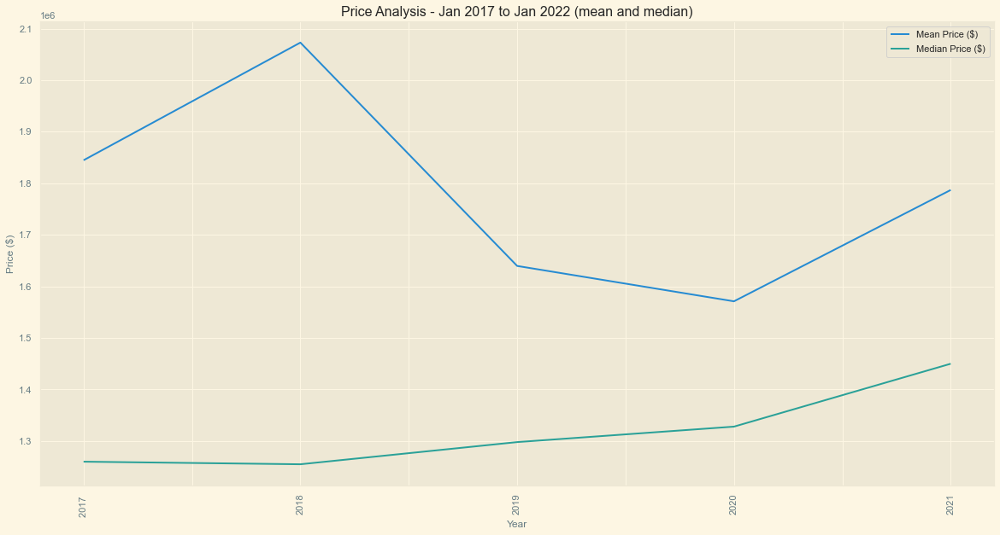

In [43]:
dataframe3.plot(x = "Year",figsize=(20,10),  rot = 90, title = 'Price Analysis - Jan 2017 to Jan 2022 (mean and median)')
plt.ylabel('Price ($)')

## Price Analysis and observation - Price ($)

- The graph shows a huge gap for the outlier between the mean and median for the year 2018 which might indicate higher price for similar property transactions.
- In comparison to Unit price graph previously, it might be more useful to use Unit price ($psf) for the current data analysis.

## Scatter Plot Observation 

In [44]:
# Dataframe with conditions created for better visualization 
df_unit_v_pr = df_singapore_condo_apt_data[(df_singapore_condo_apt_data['Price ($)'].between(0,10000000, inclusive = True) & 
                                      (df_singapore_condo_apt_data['Area (Sqft)'].between(0,6000, inclusive = True)))]
df_unit_v_pr.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
24402,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,7109000,-,1432,Strata,16 to 20,4966,2021-05-01,2021,5
24501,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,6880000,-,1432,Strata,16 to 20,4806,2021-05-01,2021,5
22861,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,6824705,-,1432,Strata,16 to 20,4767,2021-10-01,2021,10
24494,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,6789000,-,1432,Strata,11 to 15,4742,2021-05-01,2021,5
22509,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,6499000,-,1432,Strata,11 to 15,4540,2021-10-01,2021,10


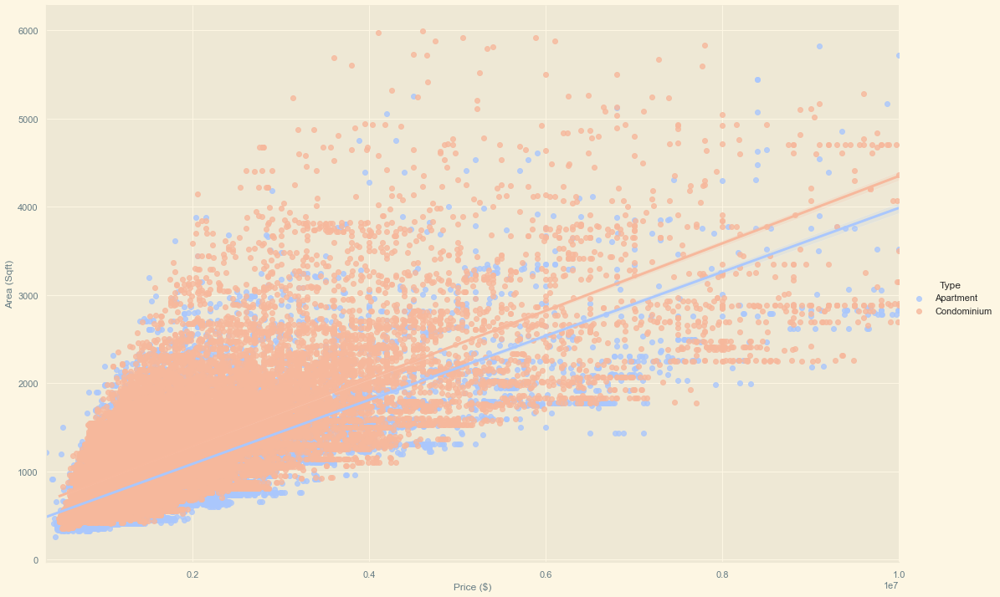

In [45]:
# Unit Price($psf) versus Price in the data analysis (Scatter Plot)
sns.lmplot(y='Area (Sqft)', x='Price ($)', data=df_unit_v_pr,hue = "Type", palette= 'coolwarm', height=10, aspect=1.5)

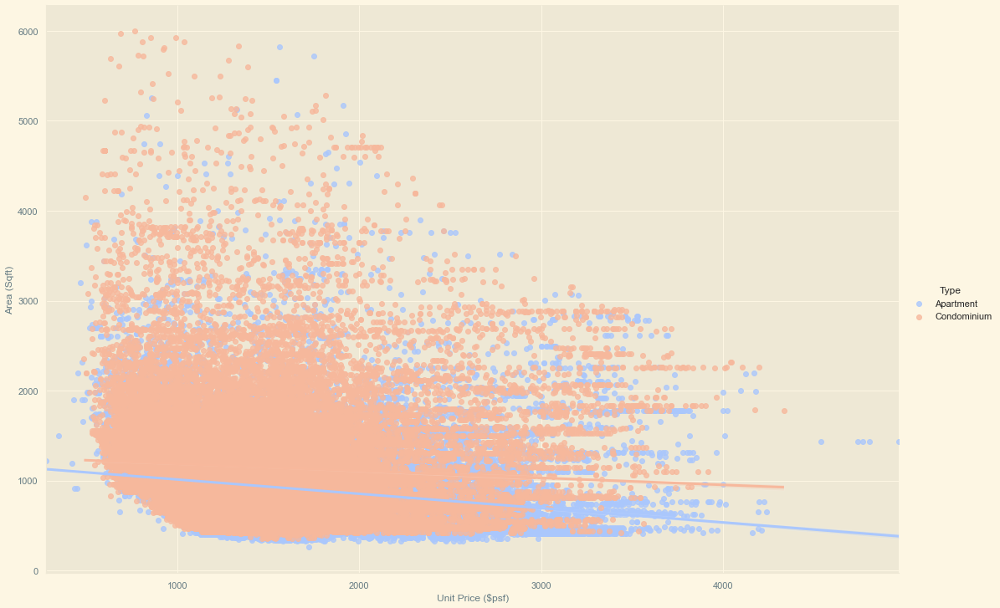

In [46]:
# Unit Price($psf) versus Unit Price in the data analysis (Scatter Plot)
sns.lmplot(y='Area (Sqft)', x='Unit Price ($psf)', data=df_unit_v_pr,hue = "Type", palette= 'coolwarm', height=10, aspect=1.5)

## Scatter Plot Observation
Using scatter plot for further observation, Unit Price($psf) showed high concentrated area on type of properties in the plot as compared to Price($). Thus, Unit Price($psf) can be more useful and reliable in the data analysis.

<AxesSubplot:xlabel='Year', ylabel='Unit Price ($psf)'>

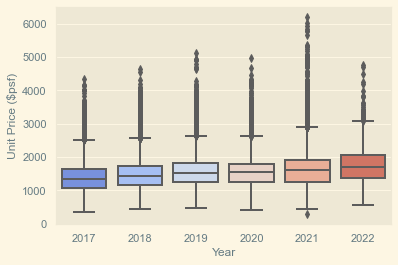

In [47]:
# Creating boxplot to see trend for median
sns.boxplot(x="Year", y="Unit Price ($psf)", data=df_singapore_condo_apt_data, palette="coolwarm")

## 2017 to 2022 - Unit Price ($psf) observation using plotly for data visualization.

In [ ]:
# Plotly to analyze the Unit Price ($psf) - 2017 to 2022 dataset
#trace0_1_overall = go.Box(y = df_singapore_condo_apt_data['Unit Price ($psf)'], 
                #name = 'Unit Price ($psf)',
               #marker_color = 'lightseagreen')

In [ ]:
#data = [trace0_1_overall]

#offline.iplot(data)

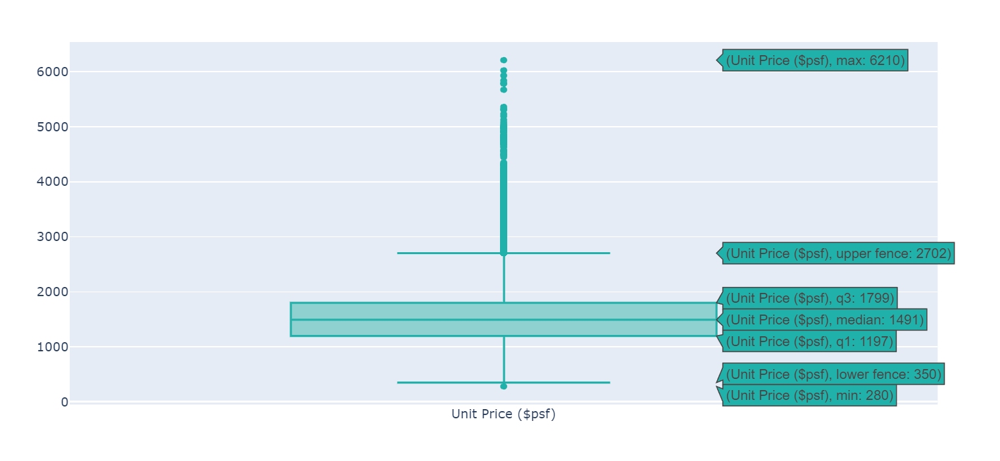


In [ ]:
# Use Plotly to analyze the Unit Price ($psf) - 2017 to 2022 dataset
#trace0_2_overall = go.Box(y = df_singapore_condo_apt_data['Unit Price ($psf)'], 
                #name = 'Unit Price ($psf)', marker_color = 'lightseagreen',
                
                #boxpoints = 'all',  # see the actual points which make up our data for the box plot
                
                #boxmean = True  # draw dotted line for the mean                 
               #)

In [ ]:
#data = [trace0_2_overall]

#offline.iplot(data)

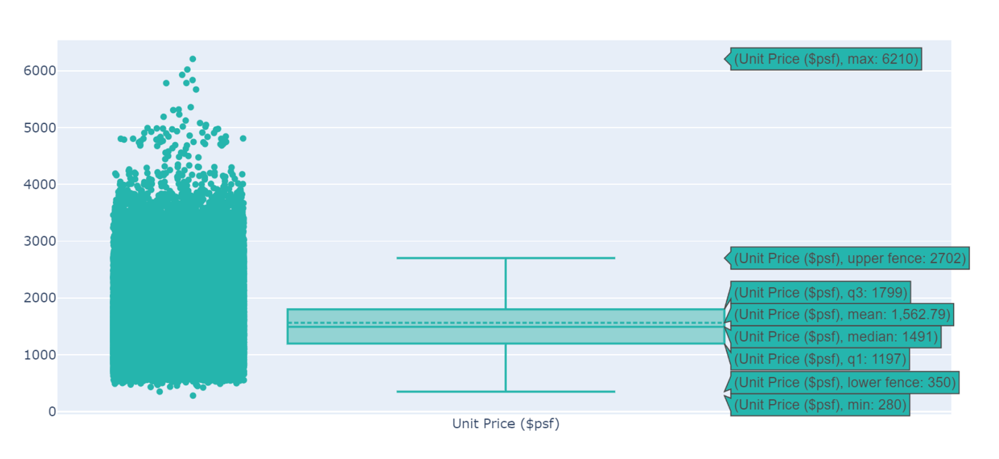

### 2017 -  Use Plotly to analyze the Unit Price ($psf) 

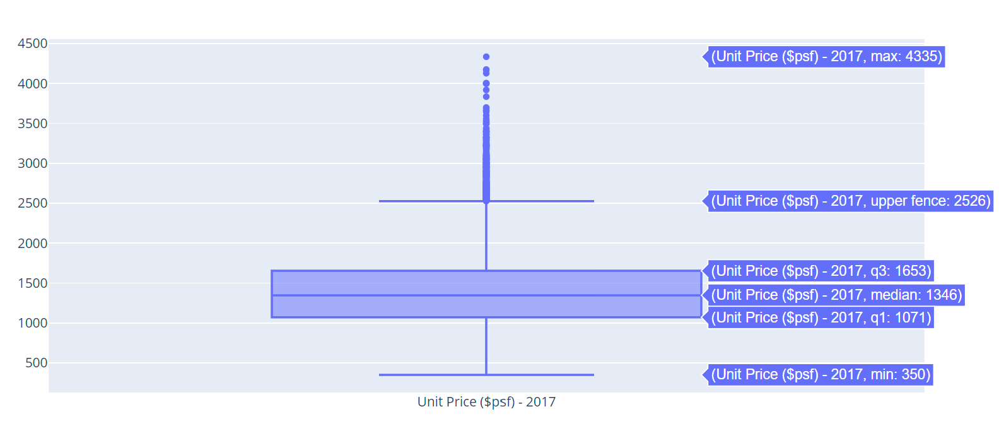
- https://plotly.com/~ab.rauf/41/

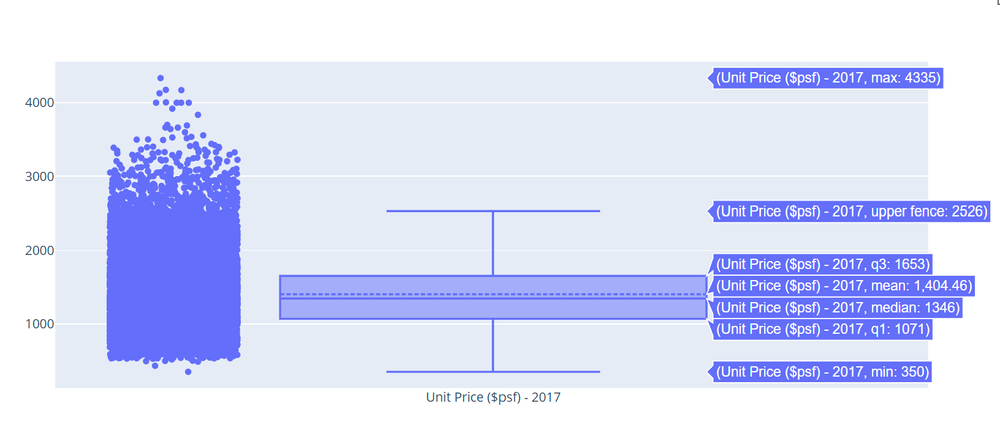

- https://plotly.com/~ab.rauf/43/

### 2018 -  Use Plotly to analyze the Unit Price ($psf) 

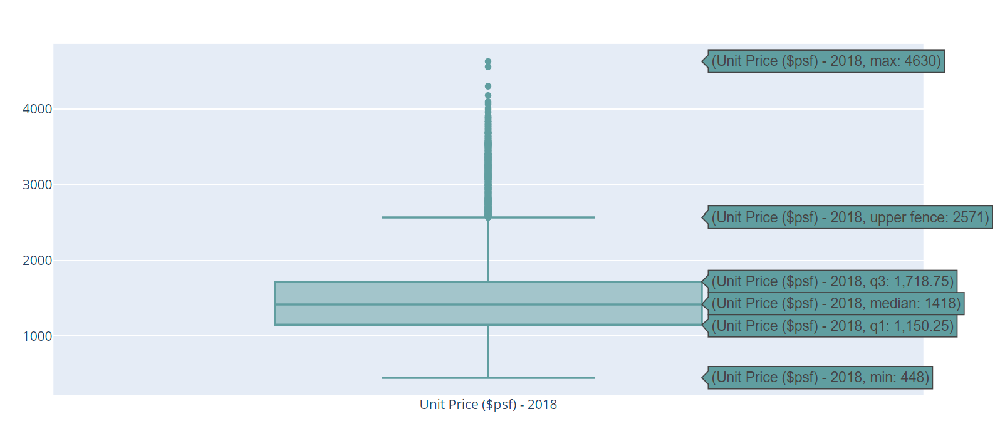
- https://plotly.com/~ab.rauf/22/

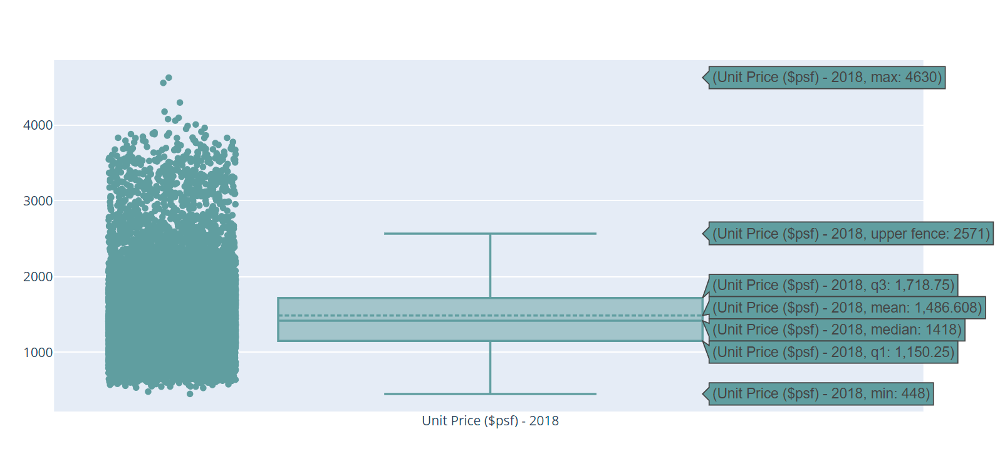

- https://plotly.com/~ab.rauf/24/

### 2019

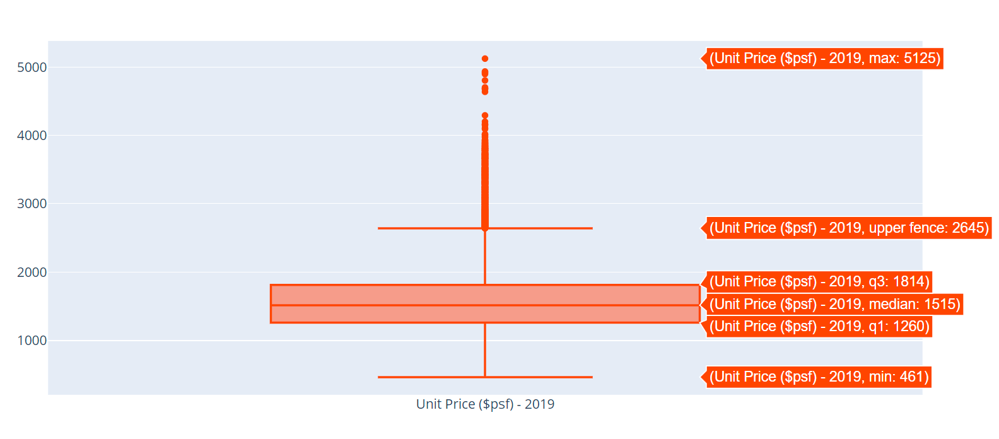

- https://plotly.com/~ab.rauf/28/

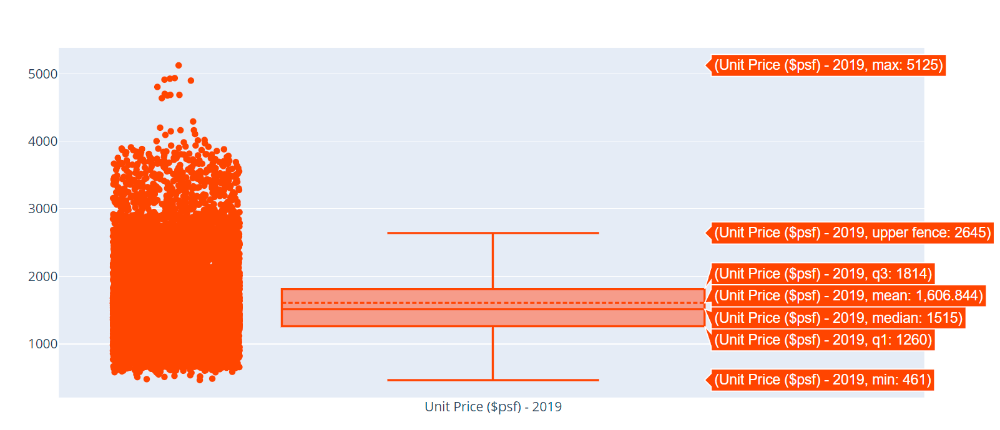
- https://plotly.com/~ab.rauf/30/

### 2020

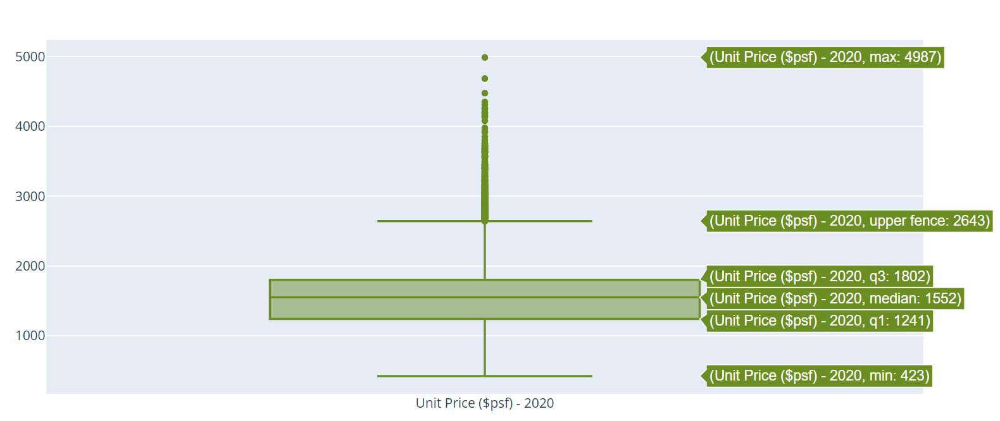

- https://plotly.com/~ab.rauf/33/

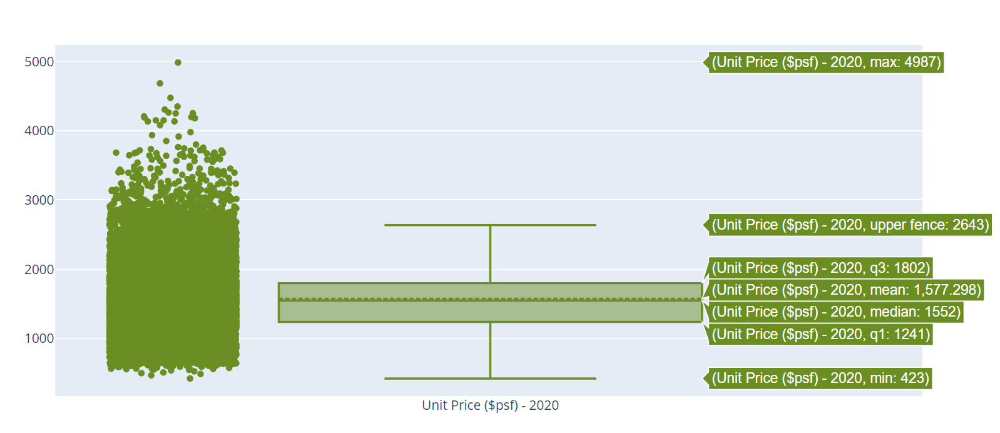
- https://plotly.com/~ab.rauf/35/

### 2021

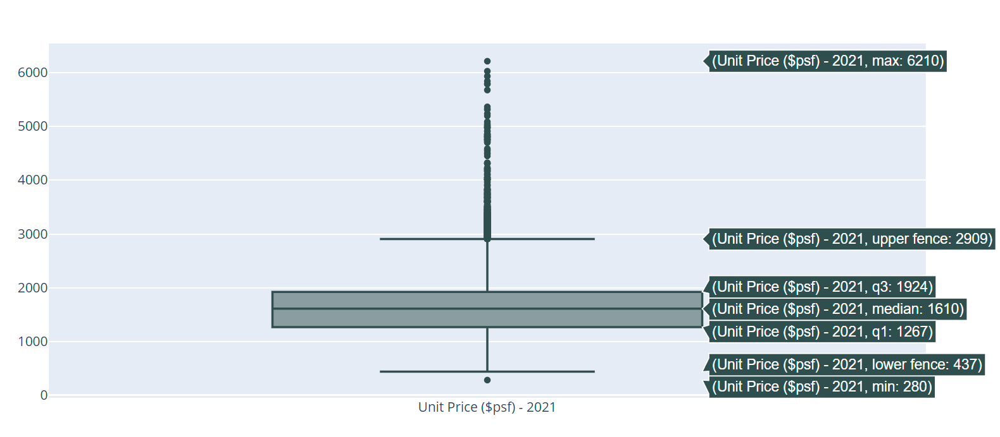

- https://plotly.com/~ab.rauf/37/

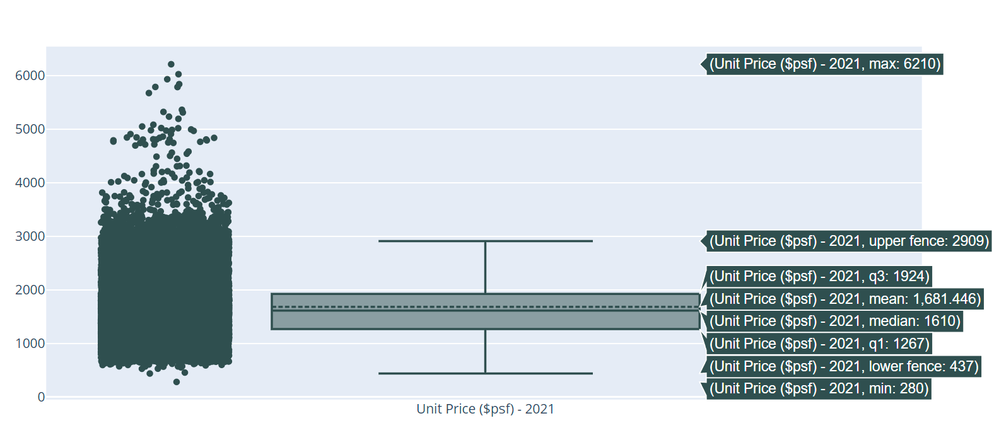
- https://plotly.com/~ab.rauf/39/

## Use Plotly to analyze and compare the Unit Price ($psf) through the 5 years with outliers


In [ ]:
# Use Plotly to analyze and compare the Unit Price ($psf) through the 5 years with outliers
#data = [trace0_1_overall,trace1_1_2017, trace2_1_2018, trace3_1_2019, trace4_1_2020, trace5_1_2021]

#offline.iplot(data)

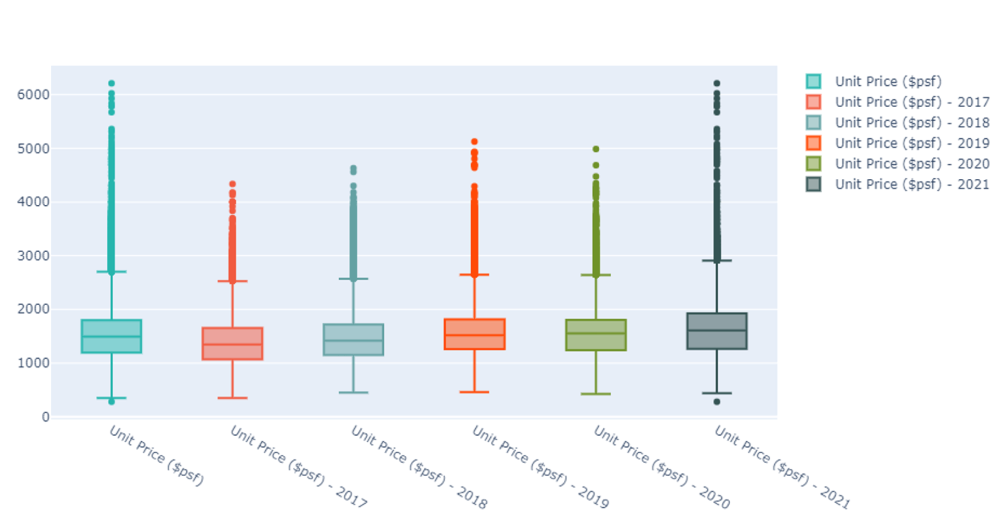

In [ ]:
#data = [trace0_2_overall,trace1_2_2017, trace2_2_2018, trace3_2_2019, trace4_2_2020, trace5_2_2021]

#offline.iplot(data)

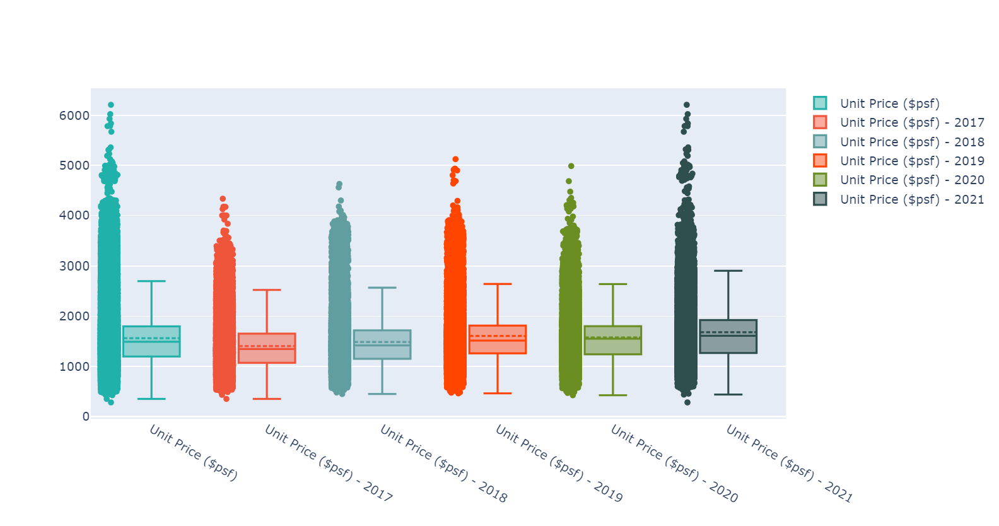

In [ ]:
#import plotly.express as px
#import pandas as pd
#df_singapore_condo_apt_data

#fig = px.parallel_coordinates(
    #df_singapore_condo_apt_data,
    #dimensions=[
        #'Unit Price ($psf)', 'Price ($)','No. of Units', 'Postal District','Year', 
    #],
    #color='Year',
    #color_continuous_scale=px.colors.sequential.Emrld)
#fig.show()

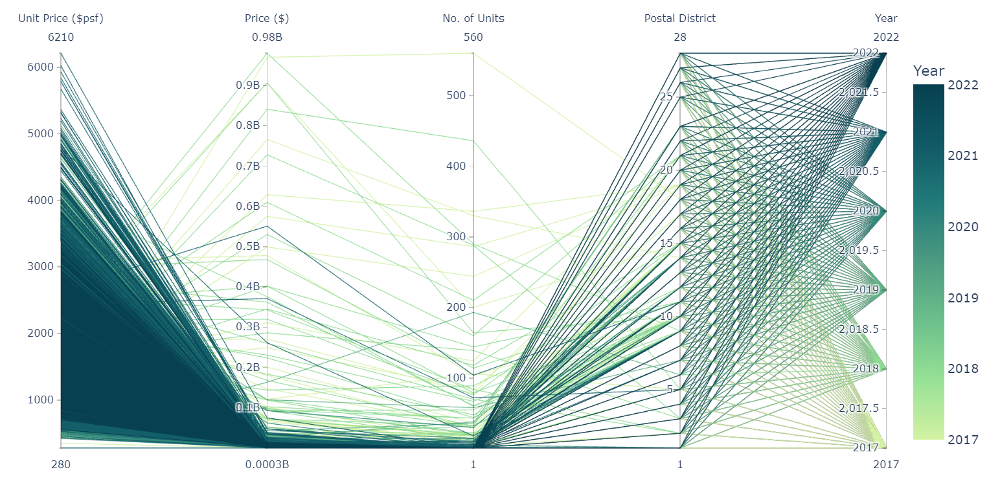

## From the plots shown for Unit Price($psf) analysis from 2017 to 2021, the following was observed:

- The median unit price psf is on the upward trend and has increased over the 5 years .
- The range of the unit price is between 280 and 6210 dollars per square feet range.
- The outliers for the unit price ranges from 2526 to 2909 dollars per square feet (Upper Fence)
- Parallel Coordinates Plot shows that there lesser transactions in the outliers


## Study the trend and find the % change in median Unit Price ($psf) for frequency range of 3 months.

In [80]:
#Resampling for a frequency of 3 months
grouper = df_singapore_condo_apt_data.groupby(pd.Grouper(key="Date of Sale",  freq="3M"))
grouper

In [81]:
grouper.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
36562,ARDMORE THREE,ARDMORE PARK,Condominium,10,CCR,Freehold,Resale,1,6543555,-,1787,Strata,26 to 30,3662,2017-02-01,2017,2
36658,ARDMORE PARK,ARDMORE PARK,Condominium,10,CCR,Freehold,Resale,1,9500000,-,2885,Strata,21 to 25,3293,2017-02-01,2017,2
36597,OUE TWIN PEAKS,LEONIE HILL ROAD,Condominium,9,CCR,99 yrs lease commencing from 2010,Resale,1,1760100,-,549,Strata,31 to 35,3206,2017-02-01,2017,2
36567,OUE TWIN PEAKS,LEONIE HILL ROAD,Condominium,9,CCR,99 yrs lease commencing from 2010,Resale,1,1725500,-,549,Strata,26 to 30,3143,2017-02-01,2017,2
36609,OUE TWIN PEAKS,LEONIE HILL ROAD,Condominium,9,CCR,99 yrs lease commencing from 2010,Resale,1,1791600,-,570,Strata,26 to 30,3140,2017-02-01,2017,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01,2021,12
21345,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,37000000,-,6523,Strata,01 to 05,5672,2021-12-01,2021,12
21330,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,10479000,-,2207,Strata,06 to 10,4749,2021-12-01,2021,12
21241,TWENTYONE ANGULLIA PARK,ANGULLIA PARK,Condominium,9,CCR,Freehold,Resale,1,10138000,-,2260,Strata,31 to 35,4485,2021-12-01,2021,12


## Median Resampling - Unit Price ($psf)

In [82]:
med_gp = grouper.median() #median value
med_gp

,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf),Year,Month
Date of Sale,,,,,,,
2017-02-28,10.0,1.0,1164240.0,980.0,1311.0,2017.0,2.0
2017-05-31,15.0,1.0,1229999.0,958.0,1385.0,2017.0,4.0
2017-08-31,14.0,1.0,1275060.0,1023.0,1332.5,2017.0,7.0
2017-11-30,15.0,1.0,1290000.0,1033.0,1334.0,2017.0,10.0
2018-02-28,15.0,1.0,1312000.0,1087.0,1315.0,2018.0,2.0
2018-05-31,15.0,1.0,1268888.0,990.0,1390.0,2018.0,4.0
2018-08-31,14.0,1.0,1210000.0,893.0,1449.0,2018.0,7.0
2018-11-30,15.0,1.0,1254000.0,904.0,1526.5,2018.0,10.0
2019-02-28,14.0,1.0,1280000.0,947.0,1460.0,2019.0,2.0


In [83]:
med_gp.index = ['Q1-2017', ' Q2-2017', 'Q3-2017', 'Q4-2017',
                'Q1-2018', ' Q2-2018', 'Q3-2018', 'Q4-2018', 
                'Q1-2019', ' Q2-2019', 'Q3-2019', 'Q4-2019',
                'Q1-2020', ' Q2-2020', 'Q3-2020', 'Q4-2020',
                'Q1-2021', ' Q2-2021', 'Q3-2021', 'Q4-2021', 'Q1-2022' ]
med_gp.head()

,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf),Year,Month
Q1-2017,10.0,1.0,1164240.0,980.0,1311.0,2017.0,2.0
Q2-2017,15.0,1.0,1229999.0,958.0,1385.0,2017.0,4.0
Q3-2017,14.0,1.0,1275060.0,1023.0,1332.5,2017.0,7.0
Q4-2017,15.0,1.0,1290000.0,1033.0,1334.0,2017.0,10.0
Q1-2018,15.0,1.0,1312000.0,1087.0,1315.0,2018.0,2.0


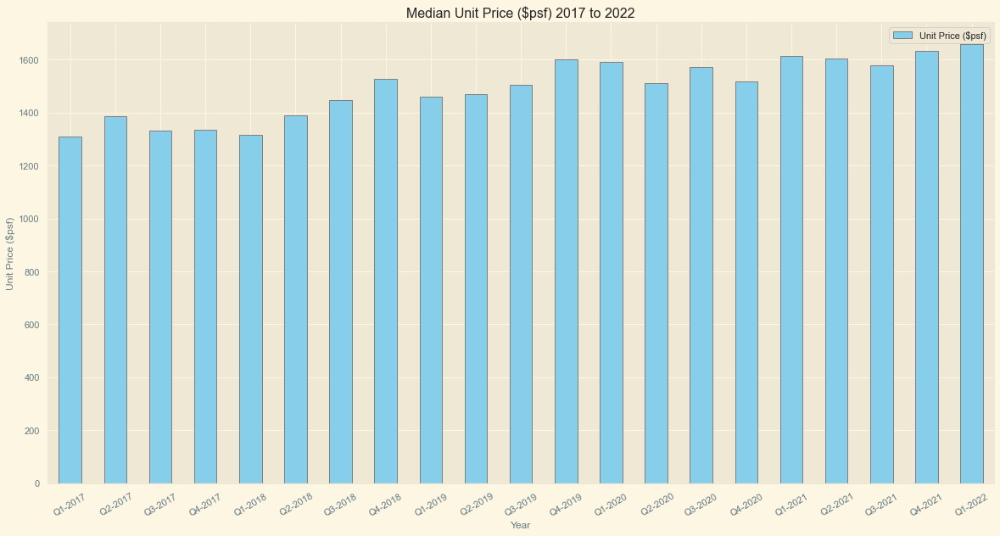

In [84]:
# Plot Median Unit Price ($psf) bar graph
med_gp.plot(kind='bar', y = 'Unit Price ($psf)', color = "skyblue", ec="grey", figsize=(20,10), rot =30, title= "Median Unit Price ($psf) 2017 to 2022")
plt.xlabel('Year')
plt.ylabel('Unit Price ($psf)')
plt.show()

In [85]:
# Percent Change - median
med_p_change = med_gp.pct_change()
med_p_change.head()

,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf),Year,Month
Q1-2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Q2-2017,0.500000,0.0,0.056482,-0.022449,0.056445,0.000000,1.000000
Q3-2017,-0.066667,0.0,0.036635,0.067850,-0.037906,0.000000,0.750000
Q4-2017,0.071429,0.0,0.011717,0.009775,0.001126,0.000000,0.428571
Q1-2018,0.000000,0.0,0.017054,0.052275,-0.014243,0.000496,-0.800000


In [88]:
# converting percentage change
convert_perc = med_p_change['Unit Price ($psf)']*100
convert_perc.head()

Q1-2017          NaN
 Q2-2017    5.644546
Q3-2017    -3.790614
Q4-2017     0.112570
Q1-2018    -1.424288
Name: Unit Price ($psf), dtype: float64

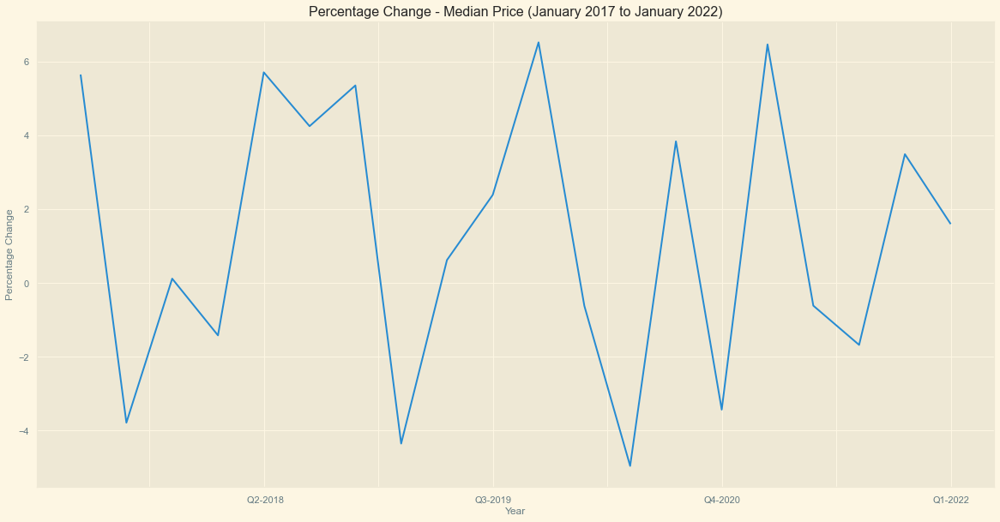

In [89]:
convert_perc.plot(y = "Unit Price ($psf)",figsize=(20,10), title = "Percentage Change - Median Price (January 2017 to January 2022)")
plt.xlabel('Year')
plt.ylabel('Percentage Change')
plt.show()

## From the plots shown, the following can be observed:

- The median unit price($psf) has increased in price between 2017 and 2022.
- The percentage change for the 3 month frequency range  varies through the years.


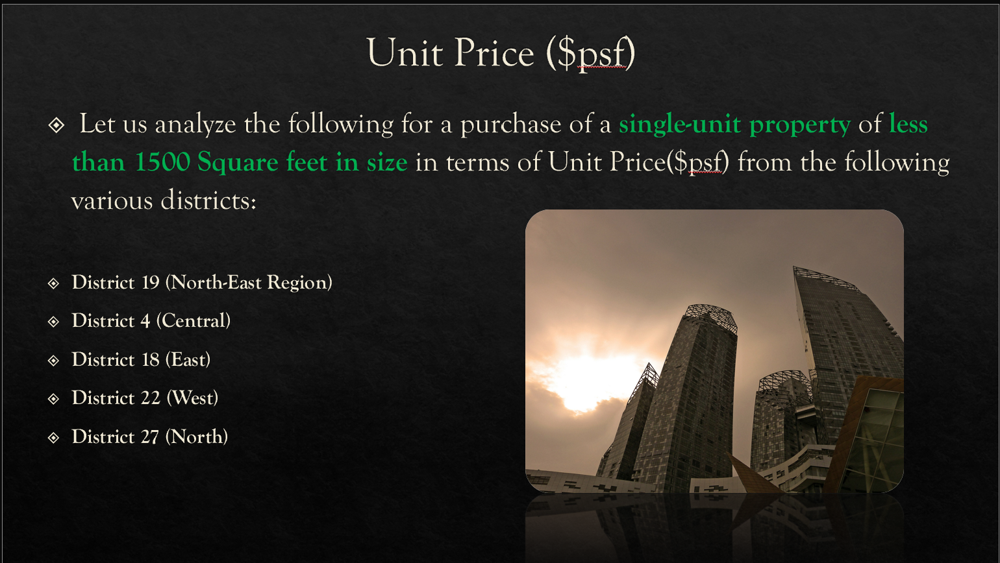

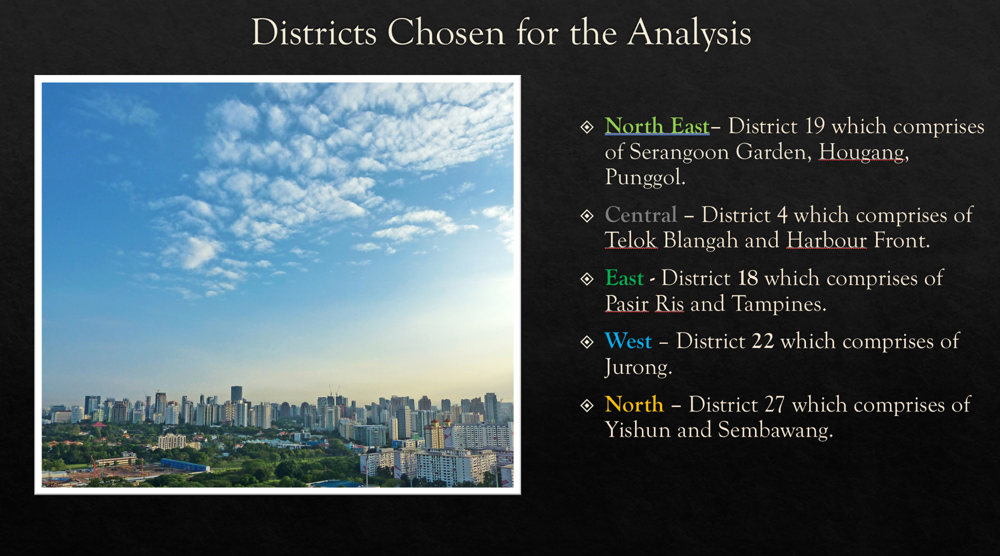

In [90]:
# Unit Price ($psf) Analysis - Jan 2017 to Jan 2022 

total_mean  = df_singapore_condo_apt_data['Unit Price ($psf)'].mean(axis=0)
total_median  = df_singapore_condo_apt_data['Unit Price ($psf)'].median(axis=0)
total_max  = df_singapore_condo_apt_data['Unit Price ($psf)'].max(axis=0)
total_min  = df_singapore_condo_apt_data['Unit Price ($psf)'].min(axis=0)
print("The mean Unit Price ($psf) of property in all districts is:$", round(total_mean,2)) # mean
print("The median Unit Price ($psf) of property in all districts is:$", round(total_median,2)) # mean
print("The maximum Unit Price ($psf) of property in all districts is:$", round(total_max,2)) # maximum price in all districts
print("The minimum Unit Price ($psf) of property in all districts is:$", round(total_min,2)) # minimum price in all districts 


The mean Unit Price ($psf) of property in all districts is:$ 1562.79
The median Unit Price ($psf) of property in all districts is:$ 1491.0
The maximum Unit Price ($psf) of property in all districts is:$ 6210
The minimum Unit Price ($psf) of property in all districts is:$ 280


### *District 19 - North-East*

In [91]:
d19 = 19
district_19 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["No. of Units"] ==1 ) 
                            & (df_singapore_condo_apt_data["Postal District"] ==19 ) 
                                         & (df_singapore_condo_apt_data["Area (Sqft)"] <1500 )] #South
max_19 = district_19['Unit Price ($psf)'].max()
mean_19 = district_19['Unit Price ($psf)'].mean()
median_19 = district_19['Unit Price ($psf)'].median()
min_19 = district_19['Unit Price ($psf)'].min()

print("The maximum Unit Price ($psf) in district", d19, "is $", max_19 )
print("The mean Unit Price ($psf) in district", d19, "is $", round(mean_19,2) )
print("The median Unit Price ($psf) in district", d19, "is $", round(median_19,2) )
print("The minimum Unit Price ($psf) in district", d19, "is $", min_19 )

The maximum Unit Price ($psf) in district 19 is $ 2346
The mean Unit Price ($psf) in district 19 is $ 1336.22
The median Unit Price ($psf) in district 19 is $ 1356.0
The minimum Unit Price ($psf) in district 19 is $ 592


### *District 4 - Central*

In [92]:
d4 = 4
district_4 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["No. of Units"] ==1 ) 
                            & (df_singapore_condo_apt_data["Postal District"] ==4 ) 
                                         & (df_singapore_condo_apt_data["Area (Sqft)"] <1500 )] #Central
max_4 = district_4['Unit Price ($psf)'].max()
median_4 = district_4['Unit Price ($psf)'].median()
mean_4 = district_4['Unit Price ($psf)'].mean()
min_4 = district_4['Unit Price ($psf)'].min()

print("The maximum Unit Price ($psf) in district", d4, "is $", max_4 )
print("The mean Unit Price ($psf) in district", d4, "is $", round(mean_4,2))
print("The median Unit Price ($psf) in district", d4, "is $", round(median_4,2))
print("The minimum Unit Price ($psf) in district", d4, "is $", min_4 )

The maximum Unit Price ($psf) in district 4 is $ 2831
The mean Unit Price ($psf) in district 4 is $ 1851.74
The median Unit Price ($psf) in district 4 is $ 1767.0
The minimum Unit Price ($psf) in district 4 is $ 954


### *District 18 - East*

In [93]:
d18 = 18
district_18 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["No. of Units"] ==1 ) 
                            & (df_singapore_condo_apt_data["Postal District"] ==18 ) 
                                         & (df_singapore_condo_apt_data["Area (Sqft)"] <1500 )] #East
max_18 = district_18['Unit Price ($psf)'].max()
mean_18 = district_18['Unit Price ($psf)'].mean()
median_18= district_18['Unit Price ($psf)'].median()
min_18 = district_18['Unit Price ($psf)'].min()

print("The maximum Unit Price ($psf) in district", d18, "is $", max_18 )
print("The mean Unit Price ($psf) in district", d18, "is $", round(mean_18,2) )
print("The median Unit Price ($psf) in district", d18, "is $", round(median_18,2) )
print("The minimum Unit Price ($psf) in district", d18, "is $", min_18 )

The maximum Unit Price ($psf) in district 18 is $ 2092
The mean Unit Price ($psf) in district 18 is $ 1202.67
The median Unit Price ($psf) in district 18 is $ 1247.0
The minimum Unit Price ($psf) in district 18 is $ 578


### *District 22 - West*

In [94]:
d22 = 22
district_22 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["No. of Units"] ==1 ) 
                            & (df_singapore_condo_apt_data["Postal District"] ==22 ) 
                                         & (df_singapore_condo_apt_data["Area (Sqft)"] <1500 )] #West
max_22 = district_22['Unit Price ($psf)'].max()
mean_22 = district_22['Unit Price ($psf)'].mean()
median_22= district_22['Unit Price ($psf)'].median()
min_22 = district_22['Unit Price ($psf)'].min()

print("The maximum Unit Price ($psf) in district", d22, "is $", max_22 )
print("The mean Unit Price ($psf) in district", d22, "is $", round(mean_22,2) )
print("The median Unit Price ($psf) in district", d22, "is $", round(median_22,2) )
print("The minimum Unit Price ($psf) in district", d22, "is $", min_22 )

The maximum Unit Price ($psf) in district 22 is $ 1959
The mean Unit Price ($psf) in district 22 is $ 1172.79
The median Unit Price ($psf) in district 22 is $ 1121.0
The minimum Unit Price ($psf) in district 22 is $ 705


### *District 27 - North*

In [134]:
d27 = 27
district_27 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["No. of Units"] ==1 ) 
                            & (df_singapore_condo_apt_data["Postal District"] ==27 ) 
                                         & (df_singapore_condo_apt_data["Area (Sqft)"] <1500 )] #North
max_27 = district_27['Unit Price ($psf)'].max()
mean_27 = district_27['Unit Price ($psf)'].mean()
median_27 = district_27['Unit Price ($psf)'].median()
min_27 = district_27['Unit Price ($psf)'].min()

print("The maximum Unit Price ($psf) in district", d27, "is $", max_27 )
print("The mean Unit Price ($psf) in district", d27, "is $", round(mean_27,2) )
print("The median Unit Price ($psf) in district", d27, "is $", round(median_27,2) )
print("The minimum Unit Price ($psf) in district", d27, "is $", min_27 )

The maximum Unit Price ($psf) in district 27 is $ 1715
The mean Unit Price ($psf) in district 27 is $ 1128.81
The median Unit Price ($psf) in district 27 is $ 1088.5
The minimum Unit Price ($psf) in district 27 is $ 564


In [135]:
import pandas as pd
from tabulate import tabulate

# creating a DataFrame
dict_district = {'District' : ['North East - District 19','Central - District 4 ', 'East - District 18', 'West - District 22', "North - District 27"],
        'Maximum Unit Price ($psf)' : [ max_19, max_4, max_18,max_22,max_27 ],
        'Mean Unit Price ($psf)' : [ mean_19, mean_4, mean_18,mean_22,mean_27 ],
        'Median Unit Price ($psf)' : [median_19, median_4, median_18,median_22,median_27 ],
        'Minimum Unit Price ($psf)' : [min_19, min_4, min_18,min_22,min_27 ],
       }
dataframe1 = pd.DataFrame(dict_district)

  
# displaying the DataFrame
dataframe1
dataframe1.style.background_gradient()

#dataframe1.style.highlight_max(color = 'lightgreen', axis = 0)
#print(tabulate(dataframe1, headers = 'keys', tablefmt = 'pretty'))



,District,Maximum Unit Price ($psf),Mean Unit Price ($psf),Median Unit Price ($psf),Minimum Unit Price ($psf)
0,North East - District 19,2346,1336.222212,1356.000000,592
1,Central - District 4,2831,1851.740376,1767.000000,954
2,East - District 18,2092,1202.666667,1247.000000,578
3,West - District 22,1959,1172.790123,1121.000000,705
4,North - District 27,1715,1128.810000,1088.500000,564


Text(0, 0.5, 'Unit price psf ($)')

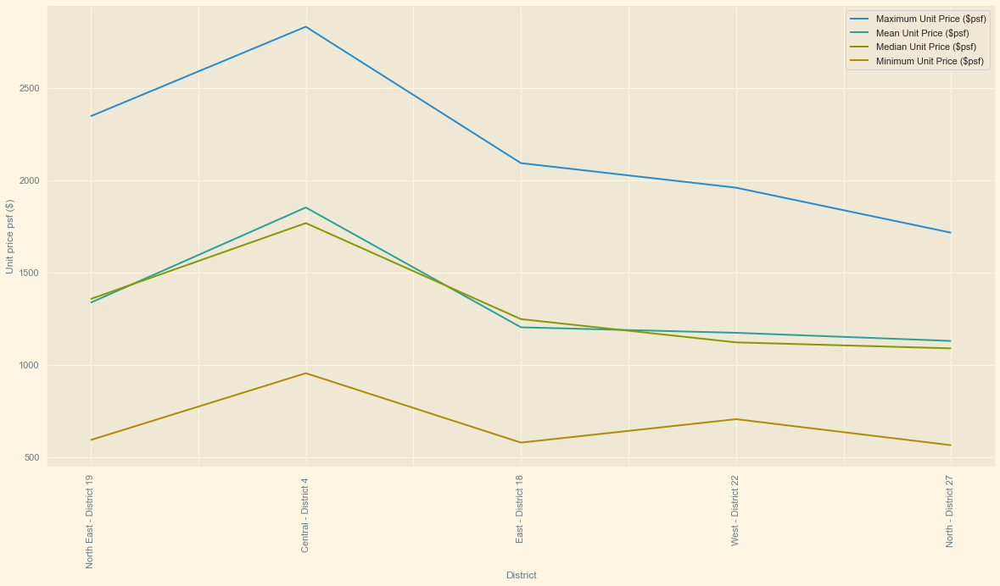

In [136]:
dataframe1.plot(x = "District",figsize=(20,10),  rot =90)
plt.ylabel('Unit price psf ($)')

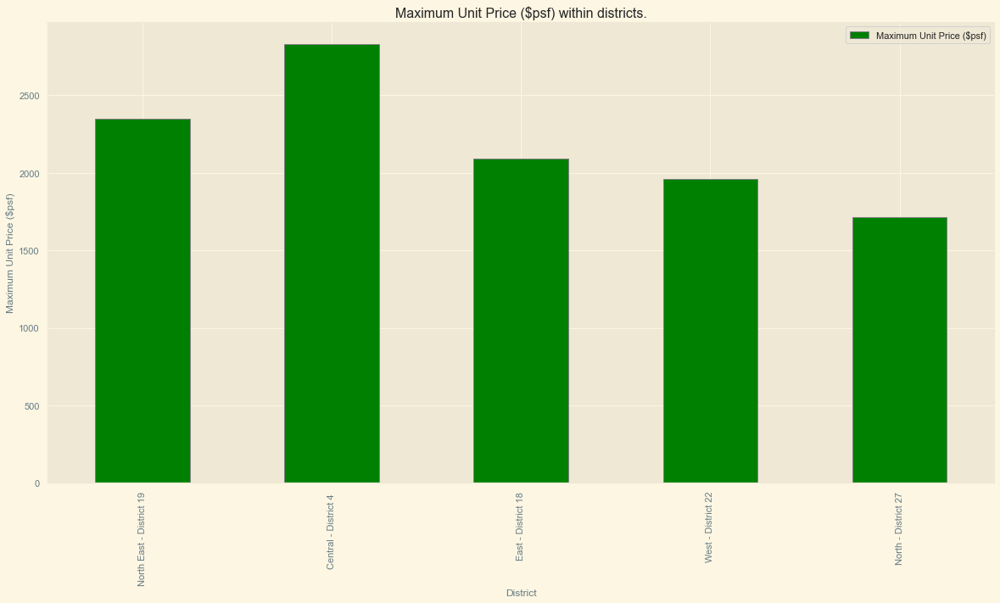

In [137]:
# Maximum price in district
dataframe1.plot(kind='bar', x = 'District', y = 'Maximum Unit Price ($psf)', color = "green", ec="grey", figsize=(20,10), title= "Maximum Unit Price ($psf) within districts.")
plt.xlabel('District')
plt.ylabel('Maximum Unit Price ($psf)')
plt.show()

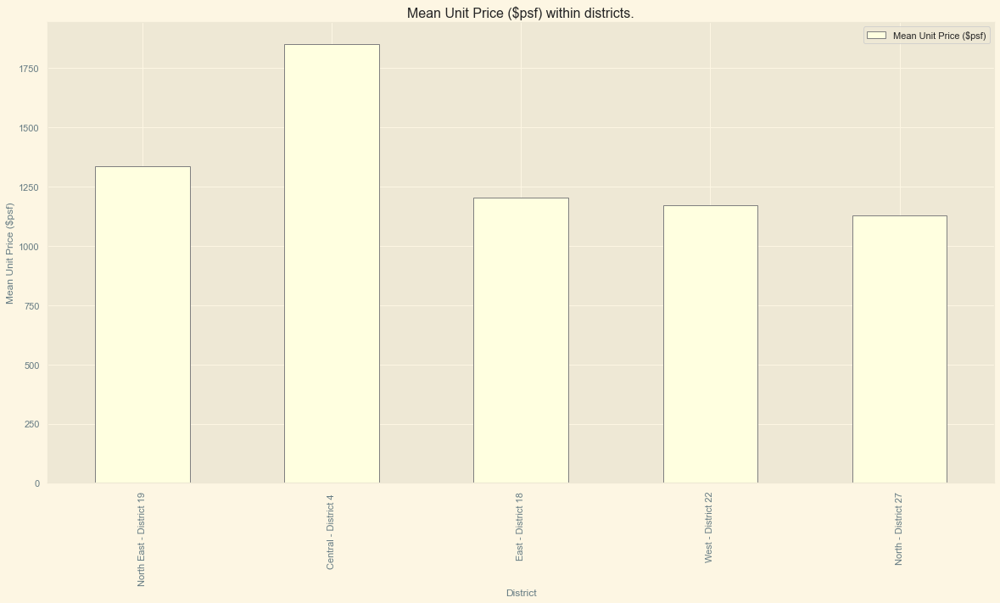

In [138]:
# Mean price in district
dataframe1.plot(kind='bar', x = 'District', y = 'Mean Unit Price ($psf)', color = "lightyellow", ec="grey", figsize=(20,10), title= "Mean Unit Price ($psf) within districts.")
plt.xlabel('District')
plt.ylabel('Mean Unit Price ($psf)')
plt.show()

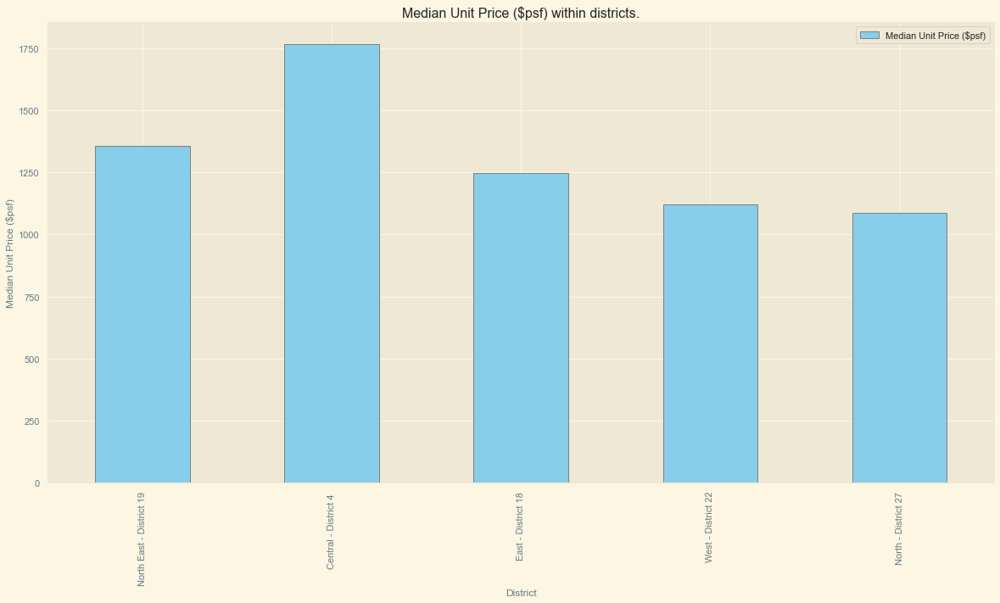

In [139]:
# Median price in district
dataframe1.plot(kind='bar', x = 'District', y = 'Median Unit Price ($psf)', color = "skyblue", ec="grey", figsize=(20,10), title= "Median Unit Price ($psf) within districts.")
plt.xlabel('District')
plt.ylabel('Median Unit Price ($psf)')
plt.show()

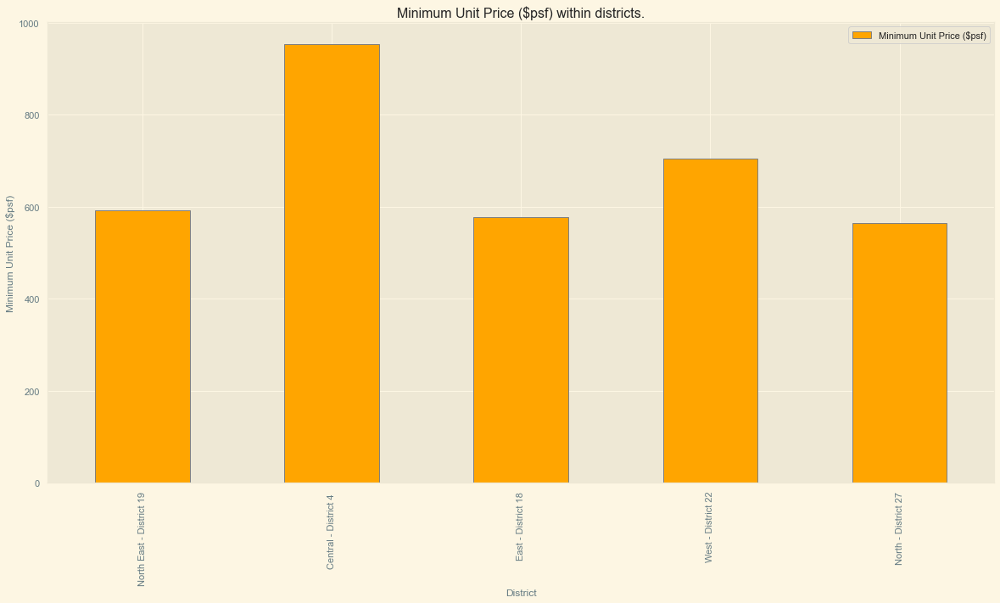

In [140]:
# Minimum price in district
dataframe1.plot(kind='bar', x = 'District', y = 'Minimum Unit Price ($psf)', color = "orange", ec="grey", figsize=(20,10), title= "Minimum Unit Price ($psf) within districts.")
plt.xlabel('District')
plt.ylabel('Minimum Unit Price ($psf)')
plt.show()

## From the data, the following can be observed : 

 - The maximum unit price ranges from 1715 to 2831 dollars per square feet.
 - The mean unit price ranges from 1128 to 1851 dollars per square feet.
 - The median unit price ranges from 1088 to 1767 dollars per square feet.
 - The minimum unit price ranges from 564 to 954 dollars per square feet.
 - Central – District 4 has the highest in terms of the maximum, mean, median and minimum unit price.
 - North – District 27 has the lowest in terms of the maximum, mean, median and minimum unit price.


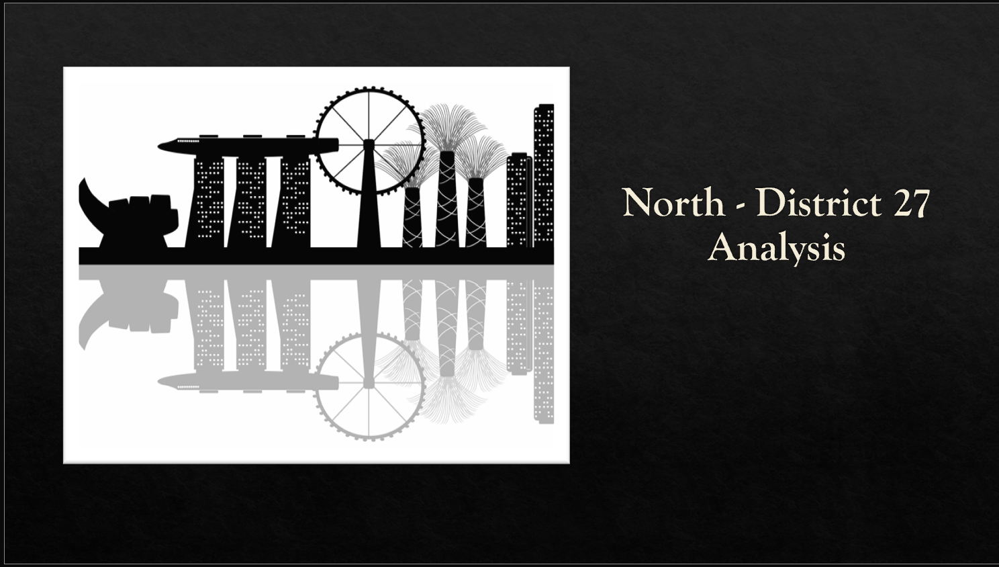

## Analysis on District 27 among the districts.

In [95]:
# Dataset for District 27
df_district_27 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Postal District"] ==27 )] 
df_district_27.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
102179,NORTH PARK RESIDENCES,YISHUN CENTRAL 1,Apartment,27,OCR,99 yrs lease commencing from 2015,Sub Sale,1,1200000,-,700,Strata,01 to 05,1715,2021-03-01,2021,3
100861,NORTH PARK RESIDENCES,YISHUN CENTRAL 1,Apartment,27,OCR,99 yrs lease commencing from 2015,Sub Sale,1,1200000,-,700,Strata,06 to 10,1715,2022-01-01,2022,1
100966,NORTH PARK RESIDENCES,YISHUN CENTRAL 1,Apartment,27,OCR,99 yrs lease commencing from 2015,Sub Sale,1,1200000,-,700,Strata,11 to 15,1715,2021-12-01,2021,12
100899,NORTH PARK RESIDENCES,YISHUN CENTRAL 1,Apartment,27,OCR,99 yrs lease commencing from 2015,Sub Sale,1,1185000,-,700,Strata,06 to 10,1694,2021-12-01,2021,12
103566,NORTH PARK RESIDENCES,YISHUN CENTRAL 1,Apartment,27,OCR,99 yrs lease commencing from 2015,Sub Sale,1,930000,-,549,Strata,06 to 10,1694,2019-06-01,2019,6


In [ ]:
# Use Plotly to analyze the Unit Price ($psf) using boxplot - District 27
#trace_d27 = go.Box(y = df_district_27['Unit Price ($psf)'], 
                #name = 'Unit Price ($psf) - District 27', marker_color = 'darkslateblue',)

In [ ]:
#data = [trace_d27]

#offline.iplot(data)

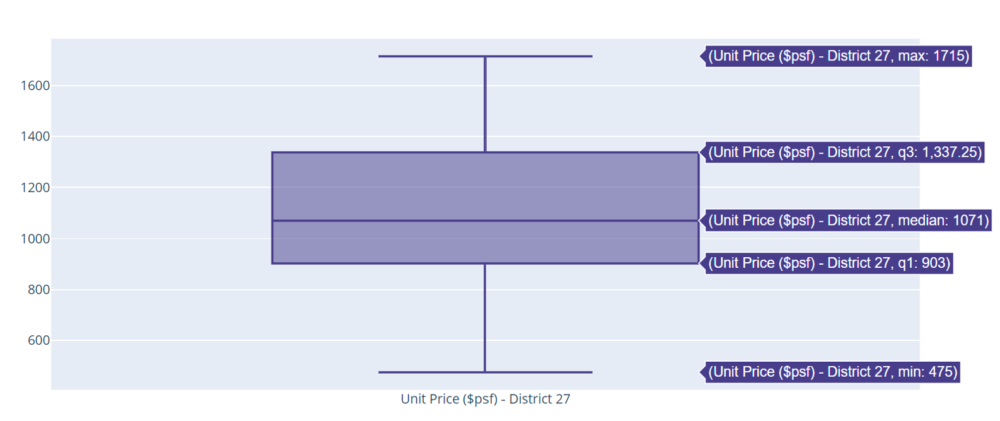
- https://plotly.com/~ab.rauf/60/

In [ ]:
#trace_d27_1 = go.Box(y = df_district_27['Unit Price ($psf)'], 
                #name = 'Unit Price ($psf) - District 27', marker_color = 'cadetblue',
                
               # boxpoints = 'all',  # see the actual points which make up our data for the box plot
                
                #boxmean = True  # draw dotted line for the mean                 
               #)

In [ ]:
#data = [trace_d27_1]

#offline.iplot(data)

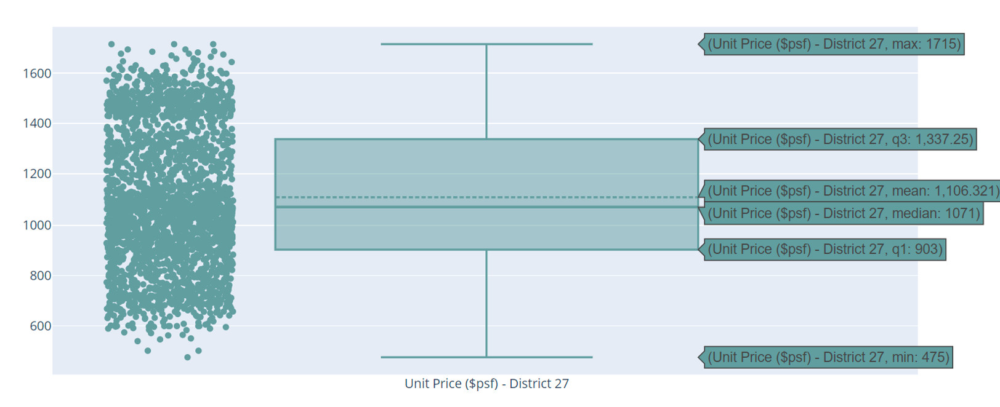

- https://plotly.com/~ab.rauf/62/

## From the plots shown, the following was observed in terms of Unit Price for district 27 :

- The median unit price is 1071 dollars per square feet.
- The mean unit price is 1106.321 dollars per square feet
- The range of the unit price is between 475 and 1715 dollars per square feet range.


## Type of Sale Analysis (Area sqft) – District 27

In [90]:
# Groupby the type of sale and number of units 
df_type_pty = df_district_27.groupby(['Type of Sale'])['No. of Units'].sum().reset_index()
df_type_pty.head(5)

,Type of Sale,No. of Units
0,New Sale,1155
1,Resale,1318
2,Sub Sale,104


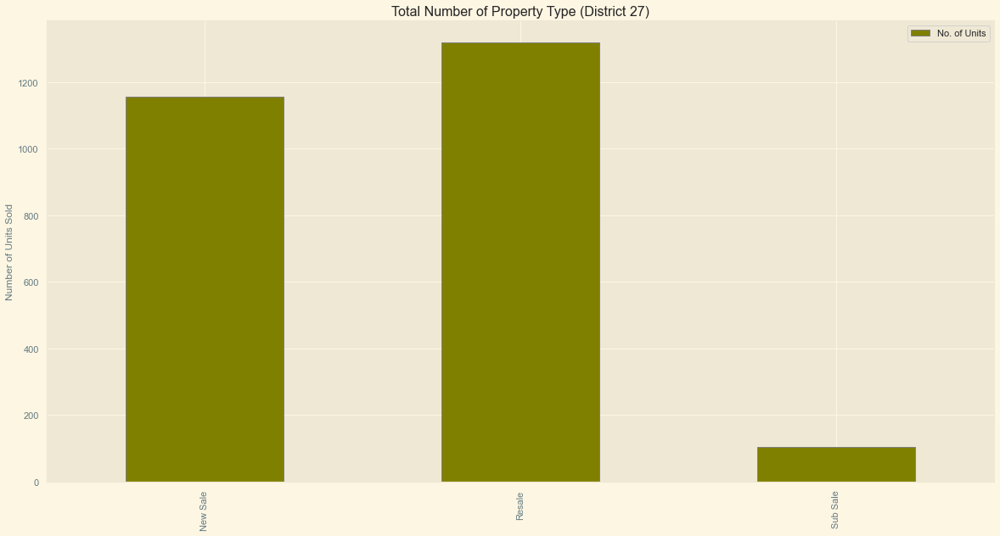

In [78]:
df_type_pty.plot(kind='bar', x = 'Type of Sale', y = 'No. of Units', color = "olive", ec="grey", figsize=(20,10),title= "Total Number of Property Type (District 27)")
plt.xlabel('')
plt.ylabel('Number of Units Sold')
plt.show()

In [97]:
df_sale_analysis = df_district_27[(df_district_27['Unit Price ($psf)'].between(0,1715, inclusive = True) & 
                                      (df_district_27['Area (Sqft)'].between(0,6000, inclusive = True)))]
df_sale_analysis.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
102179,NORTH PARK RESIDENCES,YISHUN CENTRAL 1,Apartment,27,OCR,99 yrs lease commencing from 2015,Sub Sale,1,1200000,-,700,Strata,01 to 05,1715,2021-03-01,2021,3
100861,NORTH PARK RESIDENCES,YISHUN CENTRAL 1,Apartment,27,OCR,99 yrs lease commencing from 2015,Sub Sale,1,1200000,-,700,Strata,06 to 10,1715,2022-01-01,2022,1
100966,NORTH PARK RESIDENCES,YISHUN CENTRAL 1,Apartment,27,OCR,99 yrs lease commencing from 2015,Sub Sale,1,1200000,-,700,Strata,11 to 15,1715,2021-12-01,2021,12
100899,NORTH PARK RESIDENCES,YISHUN CENTRAL 1,Apartment,27,OCR,99 yrs lease commencing from 2015,Sub Sale,1,1185000,-,700,Strata,06 to 10,1694,2021-12-01,2021,12
103566,NORTH PARK RESIDENCES,YISHUN CENTRAL 1,Apartment,27,OCR,99 yrs lease commencing from 2015,Sub Sale,1,930000,-,549,Strata,06 to 10,1694,2019-06-01,2019,6


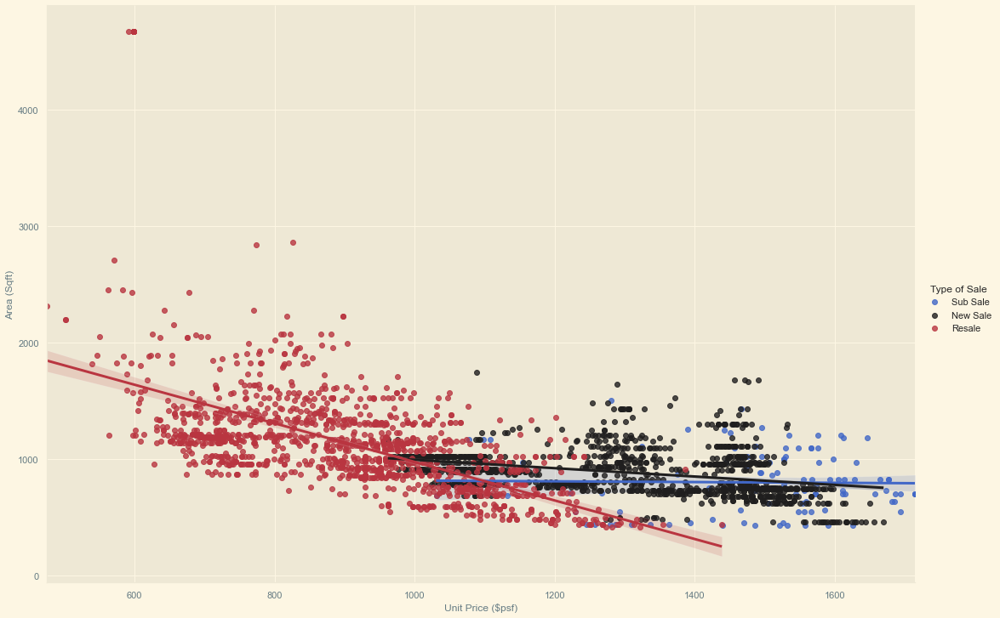

In [98]:
sns.lmplot(y='Area (Sqft)', x='Unit Price ($psf)', data=df_sale_analysis,hue = "Type of Sale", palette= 'icefire', height=10, aspect=1.5)

## For district 27, it can be observed that:

- More resale properties were purchased as compared to new sale and sub sale. 
- Using the Area (Sqft) and Unit Price to make the comparison between resale, new sale and subsale, it can also be observed that more resale properties were purchased in terms of higher Area(Sqft) and cheaper Unit Price per square feet as compared to new sale and sub sale. 



In [136]:
import pandas as pd
from tabulate import tabulate

# creating a DataFrame
dict_district = {'Data Analysis of Singapore Condominiums and Apartments Prices (2017 to 2022)' : ['What is the median Unit price($psf) for all districts ?',
                                                                                                   'What is the maximum Unit price($psf) for all districts ?',
                                                                                                   'What is the minimum Unit price($psf) for all districts ?',
                                                                                                   'Which Year has the lowest median Unit Price($psf)?',                                                                                                  
                                                                                                   'Which Year has the highest median Unit Price($psf)? ',
                                                                                                   'What is the range for Upper Fence in terms of Unit Price($psf)?',
                                                                                                   'Which Year has the most number of transactions for number of units ?',
                                                                                                   
                                                                                                   
                                                                                                   
                                                                                        ],
        'Analysis Outcomes' : ['Unit Price($psf)', 'Unit Price($psf)','Unit Price($psf)',2017,2021,'Upper Fence',2021],
        'Data Collection' : ['$1491','$6210','$280','$1346','$1610','$2526 to $2909',29352 ]}
dataframe = pd.DataFrame(dict_district)
#dataframe
# displaying the DataFrame
print(tabulate(dataframe, headers = 'keys', tablefmt = 'pretty')) 
#pretty,psql, mrst, github, fancy_grid | firstrow,keys

+---+------------------------------------------------------------------------------+-------------------+-----------------+
|   | Data Analysis of Singapore Condominiums and Apartments Prices (2017 to 2022) | Analysis Outcomes | Data Collection |
+---+------------------------------------------------------------------------------+-------------------+-----------------+
| 0 |           What is the median Unit price($psf) for all districts ?            | Unit Price($psf)  |      $1491      |
| 1 |           What is the maximum Unit price($psf) for all districts ?           | Unit Price($psf)  |      $6210      |
| 2 |           What is the minimum Unit price($psf) for all districts ?           | Unit Price($psf)  |      $280       |
| 3 |              Which Year has the lowest median Unit Price($psf)?              |       2017        |      $1346      |
| 4 |             Which Year has the highest median Unit Price($psf)?              |       2021        |      $1610      |
| 5 |       What

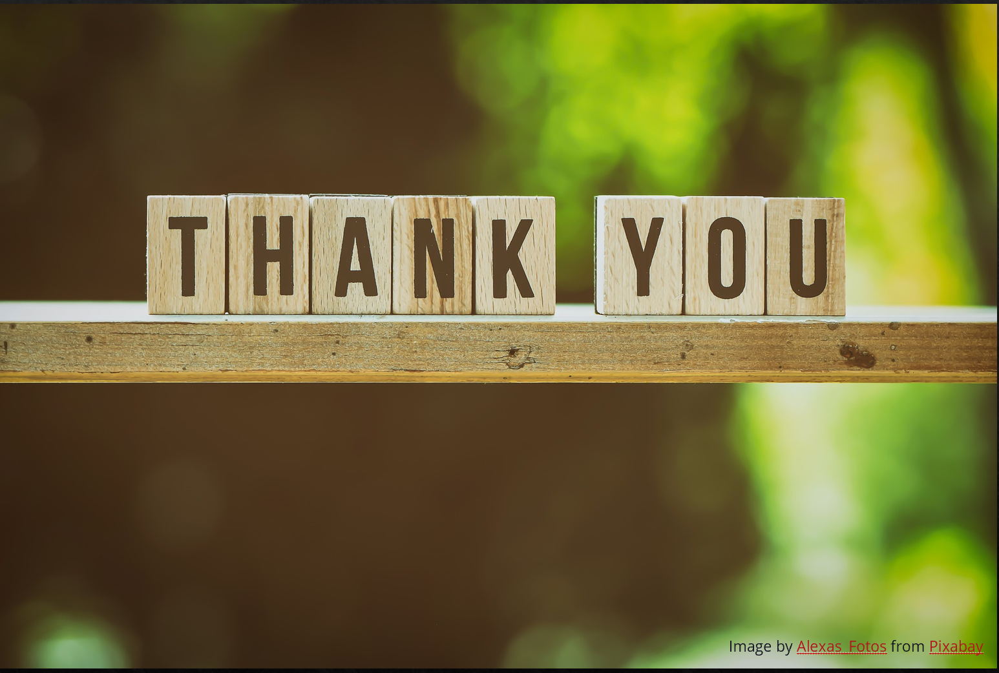